In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly as py
import plotly.express as px
import numpy as np
import gmaps
import gmaps.datasets 
from folium import Map
from folium.plugins import HeatMap
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
import warnings
warnings.filterwarnings('ignore')

# Because of the size of the dataset we must store the dataset in googlebigquery and then take the data as needed for our analysis

In [2]:
#Set environment variables for your notebook
import pyarrow 
import os 
os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = '/Users/amandamanfredo/Downloads/liquor_data.json'
#Imports google cloud client library and initiates BQ service
from google.cloud import bigquery
bigquery_client = bigquery.Client()
#Write Query on BQ
QUERY = """
SELECT date,store_number,store_name,address,city,zip_code,store_location,
county,category_name,vendor_number,vendor_name,item_description,pack,
bottle_volume_ml,state_bottle_cost,state_bottle_retail,bottles_sold,
sale_dollars,volume_sold_liters
FROM `bigquery-public-data.iowa_liquor_sales.sales` 
WHERE  (date>='2012-01-01' AND date<'2022-03-01') AND store_name LIKE '%Hy-Vee%'
ORDER BY rand()
LIMIT 100000
  """
#Run the query and write result to a pandas data frame
Query_Results = bigquery_client.query(QUERY)
df = Query_Results.to_dataframe()
#View top few rows of result
df.head()

,date,store_number,store_name,address,city,zip_code,store_location,county,category_name,vendor_number,vendor_name,item_description,pack,bottle_volume_ml,state_bottle_cost,state_bottle_retail,bottles_sold,sale_dollars,volume_sold_liters
0,2015-10-28,2548,Hy-Vee Food Store / Altoona,100 8TH STREET SW,ALTOONA,50009,POINT (-93.465301 41.644041),Polk,IMPORTED VODKA,115,"Constellation Wine Company, Inc.",Svedka Vodka,6,1750,14.75,22.13,6,132.78,10.50
1,2014-03-24,2633,Hy-Vee #3 / BDI / Des Moines,3221 SE 14TH ST,DES MOINES,50320,POINT (-93.596754 41.554101),Polk,IMPORTED GRAPE BRANDIES,420,"Moet Hennessy USA, Inc.",Hennessy Vs Cognac,12,750,18.49,27.74,24,665.76,18.00
2,2016-09-19,2591,Hy-Vee Wine and Spirits / Atlantic,None,None,None,None,None,100% Agave Tequila,300,McCormick Distilling Co.,Hussong's Platinum Anejo,6,750,22.50,33.75,1,33.75,0.75
3,2019-06-17,2573,Hy-Vee Food Store / Muscatine,2400 2nd Ave,Muscatine,52761,POINT (-91.035138 41.451349),MUSCATINE,Coffee Liqueurs,370,PERNOD RICARD USA,Kahlua Coffee,6,1750,24.99,37.49,1,37.49,1.75
4,2014-11-18,2665,Hy-Vee / Waukee,1005 E HICKMAN RD,WAUKEE,50263,POINT (-93.854477 41.615059),Dallas,BLENDED WHISKIES,260,Diageo Americas,Seagrams 7 Crown Bl Whiskey,6,1750,11.96,17.94,12,215.28,21.00


In [3]:
df.shape

(100000, 19)

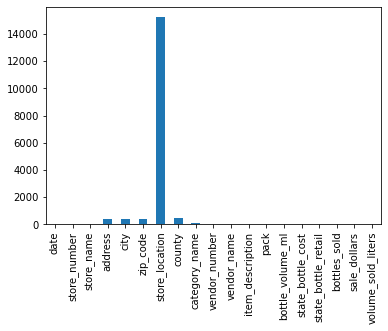

In [4]:
df.isna().sum().plot.bar(); 

In [5]:
#the dataframe is large enough that we can ignore null values and still have plenty of useful data to analyze
df.dropna(inplace=True)
df.drop_duplicates()

,date,store_number,store_name,address,city,zip_code,store_location,county,category_name,vendor_number,vendor_name,item_description,pack,bottle_volume_ml,state_bottle_cost,state_bottle_retail,bottles_sold,sale_dollars,volume_sold_liters
0,2015-10-28,2548,Hy-Vee Food Store / Altoona,100 8TH STREET SW,ALTOONA,50009,POINT (-93.465301 41.644041),Polk,IMPORTED VODKA,115,"Constellation Wine Company, Inc.",Svedka Vodka,6,1750,14.75,22.13,6,132.78,10.50
1,2014-03-24,2633,Hy-Vee #3 / BDI / Des Moines,3221 SE 14TH ST,DES MOINES,50320,POINT (-93.596754 41.554101),Polk,IMPORTED GRAPE BRANDIES,420,"Moet Hennessy USA, Inc.",Hennessy Vs Cognac,12,750,18.49,27.74,24,665.76,18.00
3,2019-06-17,2573,Hy-Vee Food Store / Muscatine,2400 2nd Ave,Muscatine,52761,POINT (-91.035138 41.451349),MUSCATINE,Coffee Liqueurs,370,PERNOD RICARD USA,Kahlua Coffee,6,1750,24.99,37.49,1,37.49,1.75
4,2014-11-18,2665,Hy-Vee / Waukee,1005 E HICKMAN RD,WAUKEE,50263,POINT (-93.854477 41.615059),Dallas,BLENDED WHISKIES,260,Diageo Americas,Seagrams 7 Crown Bl Whiskey,6,1750,11.96,17.94,12,215.28,21.00
5,2017-03-22,2618,Hy-Vee Drugstore #6 / Cedar Rapids,505 Boyson Rd NE,Cedar Rapids,52402.0,POINT (-91.63913 42.04671),LINN,Canadian Whiskies,115,CONSTELLATION BRANDS INC,Black Velvet,6,1750,10.45,15.68,24,376.32,42.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,2016-03-22,2651,Hy-Vee / Waverly,1311 4 STREET SW,WAVERLY,50677,POINT (-92.475403 42.712263),Bremer,VODKA FLAVORED,380,Phillips Beverage Company,Uv Blue (raspberry) Vodka,6,1750,10.99,16.49,6,98.94,10.50
99996,2016-04-12,2602,Hy-Vee Food Store / Webster City,823 2ND ST,WEBSTER CITY,50595,POINT (-93.825486 42.469466),Hamilton,BLENDED WHISKIES,65,Jim Beam Brands,Sunny Brook Blend Whiskey,6,1750,7.87,11.81,3,35.43,5.25
99997,2019-06-13,2532,Hy-Vee Food Store #2 / Des Moines,2540 E Euclid,Des Moines,50317,POINT (-93.569452 41.627838),POLK,Flavored Rum,370,PERNOD RICARD USA,Malibu Coconut Rum,12,750,7.49,11.24,12,134.88,9.00
99998,2019-08-09,2613,Hy-Vee Food Store #1 / Council Bluffs,2323 W Broadway,Council Bluffs,51501,POINT (-95.879662 41.261925),POTTAWATTA,American Vodkas,301.0,FIFTH GENERATION INC,Titos Handmade Mini,5,50,12.80,19.20,10,192.00,0.50


In [6]:
#seeing how much the dataframe changes after dropping null values
df.shape

(84578, 19)

In [7]:
df.info(memory_usage="deep")

<class 'pandas.core.frame.DataFrame'>
Int64Index: 84578 entries, 0 to 99999
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   date                 84578 non-null  object 
 1   store_number         84578 non-null  object 
 2   store_name           84578 non-null  object 
 3   address              84578 non-null  object 
 4   city                 84578 non-null  object 
 5   zip_code             84578 non-null  object 
 6   store_location       84578 non-null  object 
 7   county               84578 non-null  object 
 8   category_name        84578 non-null  object 
 9   vendor_number        84578 non-null  object 
 10  vendor_name          84578 non-null  object 
 11  item_description     84578 non-null  object 
 12  pack                 84578 non-null  int64  
 13  bottle_volume_ml     84578 non-null  int64  
 14  state_bottle_cost    84578 non-null  float64
 15  state_bottle_retail  84578 non-null 

In [8]:
#trying to decrease the storage usage of the datset

#decreasing integer storage
df['bottle_volume_ml'] = df['bottle_volume_ml'].astype('int32')
df['pack'] = df['pack'].astype('int32')
df['bottles_sold'] = df['bottles_sold'].astype('int32')

#decreasing float memory usage
df['state_bottle_cost'] = df['state_bottle_cost'].astype('float32')
df['state_bottle_retail'] = df['state_bottle_retail'].astype('float32')
df['sale_dollars'] = df['sale_dollars'].astype('float32')
df['volume_sold_liters'] = df['volume_sold_liters'].astype('float32')

In [9]:
df.info(memory_usage="deep")

<class 'pandas.core.frame.DataFrame'>
Int64Index: 84578 entries, 0 to 99999
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   date                 84578 non-null  object 
 1   store_number         84578 non-null  object 
 2   store_name           84578 non-null  object 
 3   address              84578 non-null  object 
 4   city                 84578 non-null  object 
 5   zip_code             84578 non-null  object 
 6   store_location       84578 non-null  object 
 7   county               84578 non-null  object 
 8   category_name        84578 non-null  object 
 9   vendor_number        84578 non-null  object 
 10  vendor_name          84578 non-null  object 
 11  item_description     84578 non-null  object 
 12  pack                 84578 non-null  int32  
 13  bottle_volume_ml     84578 non-null  int32  
 14  state_bottle_cost    84578 non-null  float32
 15  state_bottle_retail  84578 non-null 

In [10]:
df['Profit_per_bottle']=df['state_bottle_retail']-df['state_bottle_cost']
df['Profit_per_sale']=df['Profit_per_bottle']*df['bottles_sold']
df.head(20)

,date,store_number,store_name,address,city,zip_code,store_location,county,category_name,vendor_number,vendor_name,item_description,pack,bottle_volume_ml,state_bottle_cost,state_bottle_retail,bottles_sold,sale_dollars,volume_sold_liters,Profit_per_bottle,Profit_per_sale
0,2015-10-28,2548,Hy-Vee Food Store / Altoona,100 8TH STREET SW,ALTOONA,50009,POINT (-93.465301 41.644041),Polk,IMPORTED VODKA,115,"Constellation Wine Company, Inc.",Svedka Vodka,6,1750,14.750000,22.129999,6,132.779999,10.50,7.379999,44.279995
1,2014-03-24,2633,Hy-Vee #3 / BDI / Des Moines,3221 SE 14TH ST,DES MOINES,50320,POINT (-93.596754 41.554101),Polk,IMPORTED GRAPE BRANDIES,420,"Moet Hennessy USA, Inc.",Hennessy Vs Cognac,12,750,18.490000,27.740000,24,665.760010,18.00,9.250000,222.000000
3,2019-06-17,2573,Hy-Vee Food Store / Muscatine,2400 2nd Ave,Muscatine,52761,POINT (-91.035138 41.451349),MUSCATINE,Coffee Liqueurs,370,PERNOD RICARD USA,Kahlua Coffee,6,1750,24.990000,37.490002,1,37.490002,1.75,12.500002,12.500002
4,2014-11-18,2665,Hy-Vee / Waukee,1005 E HICKMAN RD,WAUKEE,50263,POINT (-93.854477 41.615059),Dallas,BLENDED WHISKIES,260,Diageo Americas,Seagrams 7 Crown Bl Whiskey,6,1750,11.960000,17.940001,12,215.279999,21.00,5.980000,71.760010
5,2017-03-22,2618,Hy-Vee Drugstore #6 / Cedar Rapids,505 Boyson Rd NE,Cedar Rapids,52402.0,POINT (-91.63913 42.04671),LINN,Canadian Whiskies,115,CONSTELLATION BRANDS INC,Black Velvet,6,1750,10.450000,15.680000,24,376.320007,42.00,5.230000,125.520012
6,2016-03-03,2633,Hy-Vee #3 / BDI / Des Moines,3221 SE 14TH ST,DES MOINES,50320,POINT (-93.596754 41.554101),Polk,IMPORTED VODKA - MISC,260.0,Diageo Americas,Ketel One Citroen,12,750,12.500000,18.750000,12,225.000000,9.00,6.250000,75.000000
7,2021-09-24,2644,Hy-Vee Fort Dodge Wine and Spirits,1511 2nd Ave North,Fort Dodge,50501.0,POINT (-94.177165 42.508344),WEBSTER,Temporary & Specialty Packages,259,Heaven Hill Brands,Fultons Harvest Pumpkin Liqueur,12,750,5.500000,8.250000,72,594.000000,54.00,2.750000,198.000000
8,2013-05-21,2649,Hy-Vee #3 / Dubuque,400 LOCUST ST,DUBUQUE,52001,POINT (-90.666497 42.49721900000001),Dubuque,VODKA 80 PROOF,421,"Sazerac Co., Inc.",Nikolai Vodka,6,1750,6.920000,10.380000,6,62.279999,10.50,3.460000,20.760000
9,2014-04-28,2512,Hy-Vee Wine and Spirits / Iowa City,1720 WATERFRONT DR,IOWA CITY,52240,POINT (-91.53046300000001 41.642764),Johnson,SCOTCH WHISKIES,35,"Bacardi U.S.A., Inc.",Dewars White Label Scotch,12,1000,16.870001,25.309999,12,303.720001,12.00,8.439999,101.279984
10,2014-05-08,2663,Hy-Vee / Urbandale,8701 DOUGLAS,URBANDALE,50322,POINT (-93.739105 41.629364),Polk,SINGLE BARREL BOURBON WHISKIES,421,"Sazerac Co., Inc.",Eagle Rare,6,750,17.160000,25.740000,6,154.440002,4.50,8.580000,51.480000


In [11]:
#getting an idea of the average profit per bottle
print('mean:',df['Profit_per_bottle'].mean())

#getting an idea of median profit since a few expensive/profitable bottles can skew mean
print('median:',df['Profit_per_bottle'].median())

#finding the max profit per bottle
df.loc[df['Profit_per_bottle'] == df['Profit_per_bottle'].max()] 

mean: 5.302696704864502
median: 4.25


,date,store_number,store_name,address,city,zip_code,store_location,county,category_name,vendor_number,vendor_name,item_description,pack,bottle_volume_ml,state_bottle_cost,state_bottle_retail,bottles_sold,sale_dollars,volume_sold_liters,Profit_per_bottle,Profit_per_sale
51707,2015-10-27,2666,Hy-Vee #2 / Ankeny,2510 SW STATE ST,ANKENY,50023,POINT (-93.621824 41.705188),Polk,TENNESSEE WHISKIES,125,"Cedar Ridge Vineyards,LLC",Cedar Ridge Port Cask Finish Barrel #2666,1,750,6000.0,9000.0,1,9000.0,0.75,3000.0,3000.0


array([[<AxesSubplot:title={'center':'Profit_per_bottle'}>]], dtype=object)

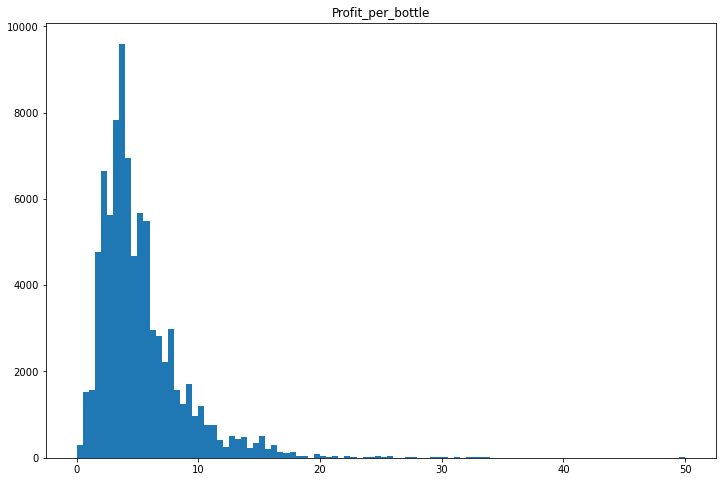

In [12]:
#seeing the distribution of profit per bottle
df.hist(column='Profit_per_bottle', bins=100, grid=False, figsize=(12,8),range=[0, 50])

In [13]:
df['category_name'].nunique()

125

In [14]:
#turning the store names to lowercase to prevent discrepancies
df['store_name'] = df['store_name'].str.lower()

df['category_name'] = df['category_name'].str.lower()

In [15]:
#defining a function to create a column of the different store types for hy-vee
def store(b):
    if ('quick' in b) or ('kwik' in b) or ('conven' in b) or ('fresh' in b) or ('c-store' in b):
        return 'Convenience'
    elif ('gas' in b) or ('petro' in b) or ('fuel' in b):
        return 'Gas'
    elif ('liquor' in b) or ('spirits' in b) or ('beverage' in b) or ('bottle' in b) or ('distil' in b) or ('wine' in b):
        return 'Liquor Store'
    elif ('drug' in b) or ('pharmacy' in b):
        return 'Drug Store'
    else:
        return 'Supermarket'

df['Store Type'] = df.store_name.apply(lambda y: store(y))

In [16]:
df['Store Type'].value_counts()

Supermarket     55945
Liquor Store    15891
Drug Store      12196
Convenience       490
Gas                56
Name: Store Type, dtype: int64

In [17]:
#making a function to classify the different liquor types into a column

def func(a):
    if "vodka" in a:
        return "vodka"
    elif "tequila" in a:
        return "tequila"
    elif "rum" in a:
        return "rum"
    elif "gin" in a:
        return "gin"
    elif "wine" in a:
        return "wine"
    elif "beer" in a:
        return "beer"
    elif "wine" in a:
        return "wine"
    elif "brand" in a:
        return "brandy"
    elif ('liqueur' in a) or ("triple" in a):
        return 'liqueurs'
    elif "schnap" in a:
        return "schnapps"
    elif ('grain spirits' in a):
        return 'moonshine'
    elif ('mezcal' in a):
        return 'mezcal'
    elif ('cocktail' in a):
        return 'cocktail mix'
    elif 'special' in a:
        return "gifts"
    elif "whisk" in a or "bourbon" in a or "scotch" in a:
        return "whisky"
    else:
        return "Other"

df["LiquorType"] = df.category_name.apply(lambda x: func(x))

In [18]:
df['LiquorType'].value_counts()

whisky          22472
vodka           20232
liqueurs        10629
rum              9254
schnapps         4823
tequila          4425
brandy           3742
gin              3488
cocktail mix     3243
gifts            1346
Other             538
moonshine         308
beer               42
mezcal             36
Name: LiquorType, dtype: int64

In [19]:
#turing the column to str so we can make this function
df.bottle_volume_ml = df.bottle_volume_ml.astype(str)

In [20]:
#making a function to convert bottle volume into categories
def bottle(c):
    if "750" in c:
        return "750"
    elif "1750" in c:
        return "1750"
    elif "375" in c:
        return "375"
    elif "50" in c:
        return "c"
    elif "1000" in c:
        return "1000"
    elif "200" in c:
        return "200"
    elif "100" in c:
        return "100"
    else:
        return "Other"

df['Bottle Size'] = df.bottle_volume_ml.apply(lambda y: bottle(y))

In [21]:
#dropping original column since its now repetitive
df = df.drop('bottle_volume_ml', 1)

In [22]:
df

,date,store_number,store_name,address,city,zip_code,store_location,county,category_name,vendor_number,vendor_name,item_description,pack,state_bottle_cost,state_bottle_retail,bottles_sold,sale_dollars,volume_sold_liters,Profit_per_bottle,Profit_per_sale,Store Type,LiquorType,Bottle Size
0,2015-10-28,2548,hy-vee food store / altoona,100 8TH STREET SW,ALTOONA,50009,POINT (-93.465301 41.644041),Polk,imported vodka,115,"Constellation Wine Company, Inc.",Svedka Vodka,6,14.75,22.129999,6,132.779999,10.50,7.379999,44.279995,Supermarket,vodka,750
1,2014-03-24,2633,hy-vee #3 / bdi / des moines,3221 SE 14TH ST,DES MOINES,50320,POINT (-93.596754 41.554101),Polk,imported grape brandies,420,"Moet Hennessy USA, Inc.",Hennessy Vs Cognac,12,18.49,27.740000,24,665.760010,18.00,9.250000,222.000000,Supermarket,brandy,750
3,2019-06-17,2573,hy-vee food store / muscatine,2400 2nd Ave,Muscatine,52761,POINT (-91.035138 41.451349),MUSCATINE,coffee liqueurs,370,PERNOD RICARD USA,Kahlua Coffee,6,24.99,37.490002,1,37.490002,1.75,12.500002,12.500002,Supermarket,liqueurs,750
4,2014-11-18,2665,hy-vee / waukee,1005 E HICKMAN RD,WAUKEE,50263,POINT (-93.854477 41.615059),Dallas,blended whiskies,260,Diageo Americas,Seagrams 7 Crown Bl Whiskey,6,11.96,17.940001,12,215.279999,21.00,5.980000,71.760010,Supermarket,whisky,750
5,2017-03-22,2618,hy-vee drugstore #6 / cedar rapids,505 Boyson Rd NE,Cedar Rapids,52402.0,POINT (-91.63913 42.04671),LINN,canadian whiskies,115,CONSTELLATION BRANDS INC,Black Velvet,6,10.45,15.680000,24,376.320007,42.00,5.230000,125.520012,Drug Store,whisky,750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,2016-03-22,2651,hy-vee / waverly,1311 4 STREET SW,WAVERLY,50677,POINT (-92.475403 42.712263),Bremer,vodka flavored,380,Phillips Beverage Company,Uv Blue (raspberry) Vodka,6,10.99,16.490000,6,98.940002,10.50,5.500000,33.000000,Supermarket,vodka,750
99996,2016-04-12,2602,hy-vee food store / webster city,823 2ND ST,WEBSTER CITY,50595,POINT (-93.825486 42.469466),Hamilton,blended whiskies,65,Jim Beam Brands,Sunny Brook Blend Whiskey,6,7.87,11.810000,3,35.430000,5.25,3.940001,11.820002,Supermarket,whisky,750
99997,2019-06-13,2532,hy-vee food store #2 / des moines,2540 E Euclid,Des Moines,50317,POINT (-93.569452 41.627838),POLK,flavored rum,370,PERNOD RICARD USA,Malibu Coconut Rum,12,7.49,11.240000,12,134.880005,9.00,3.750000,45.000000,Supermarket,rum,750
99998,2019-08-09,2613,hy-vee food store #1 / council bluffs,2323 W Broadway,Council Bluffs,51501,POINT (-95.879662 41.261925),POTTAWATTA,american vodkas,301.0,FIFTH GENERATION INC,Titos Handmade Mini,5,12.80,19.200001,10,192.000000,0.50,6.400001,64.000008,Supermarket,vodka,c


# Looking at the type of store generating the most profits

In [23]:
total_sale_store = df.groupby('Store Type').agg({'Profit_per_sale':'sum'}).reset_index().sort_values('Profit_per_sale',ascending =False)
tts = total_sale_store.head(50)
tts

,Store Type,Profit_per_sale
4,Supermarket,2.905026e+06
3,Liquor Store,9.086138e+05
1,Drug Store,5.345867e+05
0,Convenience,1.610799e+04
2,Gas,1.402870e+03


Text(0.5, 0, 'Store Type')

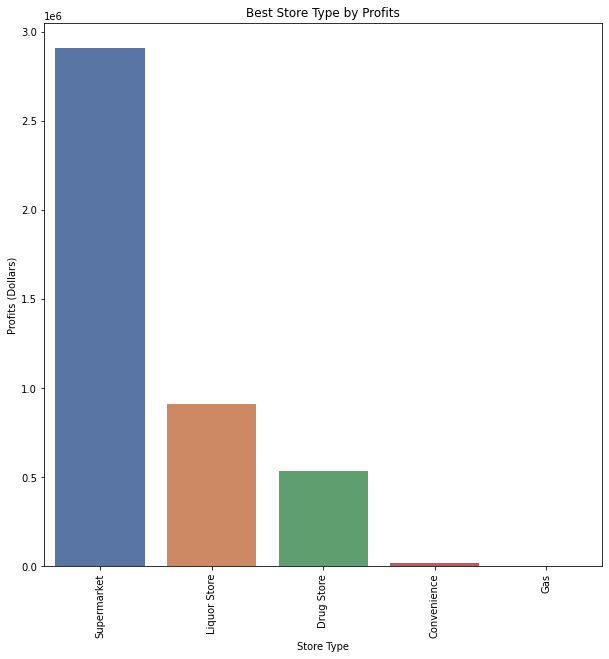

In [24]:
a1 = (10, 10)
fig, ax = plt.subplots(figsize=a1)
plot= sns.barplot(x="Store Type", y="Profit_per_sale", data=tts,palette ="deep")
plot.set_xticklabels(ax.get_xticklabels(),rotation=90)
plot.set_title('Best Store Type by Profits')
ax.set_ylabel('Profits (Dollars)')
ax.set_xlabel('Store Type')

# Which liquor type are most profitable overall 

In [25]:
total_sale_liquor = df.groupby('LiquorType').agg({'Profit_per_sale':'sum'}).reset_index().sort_values('Profit_per_sale',ascending =False)
ttb = total_sale_liquor.head(10)
ttb

,LiquorType,Profit_per_sale
13,whisky,1.419190e+06
12,vodka,1.028029e+06
6,liqueurs,5.482444e+05
9,rum,4.900409e+05
11,tequila,2.802349e+05
10,schnapps,1.479968e+05
5,gin,1.214462e+05
4,gifts,1.110927e+05
2,brandy,9.592592e+04
3,cocktail mix,9.499289e+04


Text(0.5, 0, 'Liquor Type')

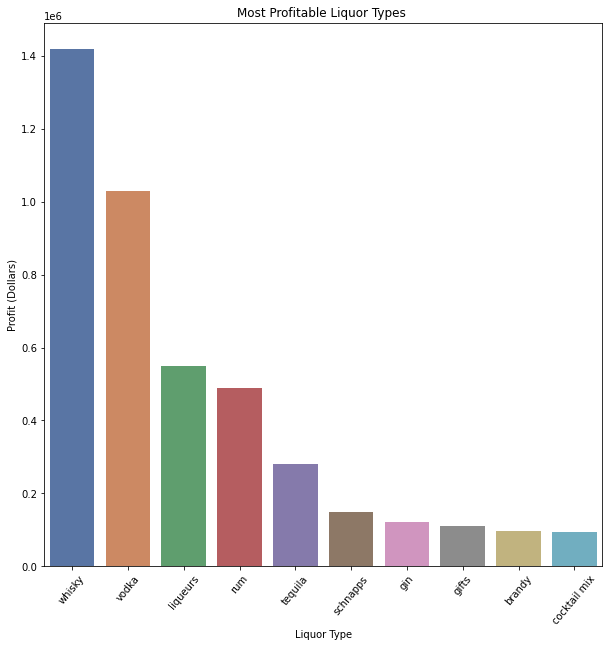

In [26]:

fig, ax = plt.subplots(figsize=(10,10))
plot= sns.barplot(x="LiquorType", y="Profit_per_sale", data=ttb,palette ="deep")
plot.set_xticklabels(ax.get_xticklabels(),rotation=50)
plot.set_title('Most Profitable Liquor Types ')
ax.set_ylabel('Profit (Dollars)')
ax.set_xlabel('Liquor Type')

# Exploring which categories of alcohol are more profitable on average

In [27]:
best10 = df.groupby(['category_name'])['Profit_per_bottle'].mean().groupby(['category_name']).max().sort_values().groupby(['category_name']).sum().sort_values(ascending=False).reset_index()

best10_plot = px.bar(best10.head(10),x=best10['category_name'].head(10), y='Profit_per_bottle',color='Profit_per_bottle')
best10_plot.update_layout(
    title="10 Best Average Profit per Bottle Liquor Categories",
    xaxis_title="Category Name",
    yaxis_title="Average Profit per Bottle($)")
best10_plot.show()

# Exploring which categories of alcohol are least profitable

In [28]:
low10_plot = px.bar(best10.tail(10),x=best10['category_name'].tail(10), y='Profit_per_bottle',color='Profit_per_bottle')
low10_plot.update_layout(
    title="10 Lowest Profit Liquor Categories",
    xaxis_title="Category Name",
    yaxis_title="Average Profit per Bottle($)")
low10_plot.show()

# Exploring which counties have the highest profits overall 

In [29]:
#turning the county names to lowercase to prevent discrepancies
df['county'] = df['county'].str.lower()

In [30]:
bestcounty = df.groupby(['county'])['Profit_per_sale'].sum().groupby(['county']).max().sort_values().groupby(['county']).sum().sort_values(ascending=False).reset_index()

bestcounty_plot = px.bar(bestcounty.head(10),x=bestcounty['county'].head(10), y='Profit_per_sale',color='Profit_per_sale')
bestcounty_plot.update_layout(
    title="10 Best County Profit Liquor",
    xaxis_title="county",
    yaxis_title="Total Profits ($)")
bestcounty_plot.show()

# Comparing sales profits by city

In [31]:
df['city'] = df['city'].str.lower()

In [32]:
bestcity = df.groupby(['city'])['Profit_per_sale'].sum().groupby(['city']).max().sort_values().groupby(['city']).sum().sort_values(ascending=False).reset_index()

bestcity_plot = px.bar(bestcity.head(10),x=bestcity['city'].head(10), y='Profit_per_sale',color='Profit_per_sale')
bestcity_plot.update_layout(
    title="10 Best City for Profit Liquor Categories",
    xaxis_title="City",
    yaxis_title="Total Profits ($)")
bestcity_plot.show()

# Finding Total Bottles Sold in each City

In [33]:
bottlecity = df.groupby(['city'])['bottles_sold'].sum().groupby(['city']).max().sort_values().groupby(['city']).sum().sort_values(ascending=False).reset_index()

bottlecity_plot = px.bar(bottlecity.head(10),x=bottlecity['city'].head(10), y='bottles_sold',color='bottles_sold')
bottlecity_plot.update_layout(
    title="10 Highest Bottles Sold by City",
    xaxis_title="City",
    yaxis_title="Total Bottles Sold")
bottlecity_plot.show()

# Comparing Vendors with the Highest Profits

In [34]:
df['vendor_name'] = df['vendor_name'].str.lower()

In [35]:
bestvendors = df.groupby(['vendor_name'])['Profit_per_sale'].sum().groupby(['vendor_name']).max().sort_values().groupby(['vendor_name']).sum().sort_values(ascending=False).reset_index()

bestvendors_plot = px.bar(bestvendors.head(10),x=bestvendors['vendor_name'].head(10), y='Profit_per_sale',color='Profit_per_sale')
bestvendors_plot.update_layout(
    title="10 Best Vendors for Profit Liquor Categories",
    xaxis_title="Vendor",
    yaxis_title="Total Profits ($)")
bestvendors_plot.show()

In [36]:

#df['city'].value_counts().head(20)
df.groupby(['city'])['store_name'].value_counts()

city             store_name                               
albia            hy-vee food store / albia                     150
algona           hy-vee wine and spirits / algona              544
altoona          hy-vee food store / altoona                  1004
ames             hy-vee  #2 / ames                             532
                 hy-vee drugstore #2 / ames                    108
                 hy-vee wine and spirits / ames                 45
ankeny           hy-vee food store #2 / state ankeny           624
                 hy-vee #2 / ankeny                            536
                 hy-vee #2                                      17
                 hy-vee gas #1 / ankeny                          7
                 hy-vee c-store #2 - ankeny                      4
atlantic         hy-vee wine and spirits / atlantic            641
                 hy-vee wine and spirits                         5
bedford          hy-vee food store / bedford                   159
bet

In [37]:
#finding the most commonly purchased category
df['category_name'].mode()

0    canadian whiskies
dtype: object

In [38]:
#finding the most common vendor in the dataset
df['vendor_name'].mode()

0    diageo americas
dtype: object

# Looking at the sales for each store location

In [39]:
store_sales= df.groupby('store_name').sale_dollars.sum().groupby(['store_name']).max().sort_values().groupby(['store_name']).sum().sort_values(ascending=False).reset_index()
store_sales_plot = px.bar(store_sales.head(10),x=store_sales['store_name'].head(10), y='sale_dollars',color='sale_dollars')
store_sales_plot.update_layout(
    title="10 Highest Sales Stores",
    xaxis_title="Store Number",
    yaxis_title="Total Sales($)")
store_sales_plot.show()

# Checking if the stores with the highest sales also have the highest profits

In [40]:
store_profit= df.groupby('store_name').Profit_per_sale.sum().groupby(['store_name']).max().sort_values().groupby(['store_name']).sum().sort_values(ascending=False).reset_index()
store_profit_plot = px.bar(store_profit.head(10),x=store_profit['store_name'].head(10), y='Profit_per_sale',color='Profit_per_sale')
store_profit_plot.update_layout(
    title="10 Highest Profit Stores",
    xaxis_title="Store Name",
    yaxis_title="Total Profits($)")
store_profit_plot.show()

# Looking at monthly profits for liquor types

# Creating a Heatmap of the locations of the liquor stores in Iowa

In [41]:
#First we need to clean up the store location column
# df1=df
# df1 = df1[df1['store_location'].notna()]


In [42]:
#Changing the column type to string so we can strip leading POINT
df['store_location'] = df.store_location.astype(str)

#stripping the non-latitude-longitude values from the column
df['store_location'] = df['store_location'].map(lambda x: x.lstrip('POINT (').rstrip(')'))


In [43]:
#creating latitude and longitude columns to use for our heatmap
df[['Longitude','Latitude']] = df['store_location'].str.split(' ', expand=True)


In [44]:
#folium requires the data to be float type

df['Latitude'] = df['Latitude'].str.replace(' ', '').astype(float)
df['Longitude'] = df['Longitude'].str.replace(' ', '').astype(float)

#dropping the original store location column since now it is repetitive
df = df.drop('store_location', 1)

In [45]:
df.head()

,date,store_number,store_name,address,city,zip_code,county,category_name,vendor_number,vendor_name,item_description,pack,state_bottle_cost,state_bottle_retail,bottles_sold,sale_dollars,volume_sold_liters,Profit_per_bottle,Profit_per_sale,Store Type,LiquorType,Bottle Size,Longitude,Latitude
0,2015-10-28,2548,hy-vee food store / altoona,100 8TH STREET SW,altoona,50009,polk,imported vodka,115,"constellation wine company, inc.",Svedka Vodka,6,14.75,22.129999,6,132.779999,10.50,7.379999,44.279995,Supermarket,vodka,750,-93.465301,41.644041
1,2014-03-24,2633,hy-vee #3 / bdi / des moines,3221 SE 14TH ST,des moines,50320,polk,imported grape brandies,420,"moet hennessy usa, inc.",Hennessy Vs Cognac,12,18.49,27.740000,24,665.760010,18.00,9.250000,222.000000,Supermarket,brandy,750,-93.596754,41.554101
3,2019-06-17,2573,hy-vee food store / muscatine,2400 2nd Ave,muscatine,52761,muscatine,coffee liqueurs,370,pernod ricard usa,Kahlua Coffee,6,24.99,37.490002,1,37.490002,1.75,12.500002,12.500002,Supermarket,liqueurs,750,-91.035138,41.451349
4,2014-11-18,2665,hy-vee / waukee,1005 E HICKMAN RD,waukee,50263,dallas,blended whiskies,260,diageo americas,Seagrams 7 Crown Bl Whiskey,6,11.96,17.940001,12,215.279999,21.00,5.980000,71.760010,Supermarket,whisky,750,-93.854477,41.615059
5,2017-03-22,2618,hy-vee drugstore #6 / cedar rapids,505 Boyson Rd NE,cedar rapids,52402.0,linn,canadian whiskies,115,constellation brands inc,Black Velvet,6,10.45,15.680000,24,376.320007,42.00,5.230000,125.520012,Drug Store,whisky,750,-91.639130,42.046710


In [46]:
import folium
from IPython.display import display

mymap= folium.Map(location=[43.088341,-93.990256], zoom_start=8, )

hm_wide = HeatMap(
    list(zip(df.Latitude.values, df.Longitude.values)),
    min_opacity=0.3,
    radius=10, 
    blur=9, 
    max_zoom=1,
)
mymap.add_child(hm_wide)
#mymap.add_child(folium.ClickForMarker(popup='Potential Location'))

In [47]:
df

,date,store_number,store_name,address,city,zip_code,county,category_name,vendor_number,vendor_name,item_description,pack,state_bottle_cost,state_bottle_retail,bottles_sold,sale_dollars,volume_sold_liters,Profit_per_bottle,Profit_per_sale,Store Type,LiquorType,Bottle Size,Longitude,Latitude
0,2015-10-28,2548,hy-vee food store / altoona,100 8TH STREET SW,altoona,50009,polk,imported vodka,115,"constellation wine company, inc.",Svedka Vodka,6,14.75,22.129999,6,132.779999,10.50,7.379999,44.279995,Supermarket,vodka,750,-93.465301,41.644041
1,2014-03-24,2633,hy-vee #3 / bdi / des moines,3221 SE 14TH ST,des moines,50320,polk,imported grape brandies,420,"moet hennessy usa, inc.",Hennessy Vs Cognac,12,18.49,27.740000,24,665.760010,18.00,9.250000,222.000000,Supermarket,brandy,750,-93.596754,41.554101
3,2019-06-17,2573,hy-vee food store / muscatine,2400 2nd Ave,muscatine,52761,muscatine,coffee liqueurs,370,pernod ricard usa,Kahlua Coffee,6,24.99,37.490002,1,37.490002,1.75,12.500002,12.500002,Supermarket,liqueurs,750,-91.035138,41.451349
4,2014-11-18,2665,hy-vee / waukee,1005 E HICKMAN RD,waukee,50263,dallas,blended whiskies,260,diageo americas,Seagrams 7 Crown Bl Whiskey,6,11.96,17.940001,12,215.279999,21.00,5.980000,71.760010,Supermarket,whisky,750,-93.854477,41.615059
5,2017-03-22,2618,hy-vee drugstore #6 / cedar rapids,505 Boyson Rd NE,cedar rapids,52402.0,linn,canadian whiskies,115,constellation brands inc,Black Velvet,6,10.45,15.680000,24,376.320007,42.00,5.230000,125.520012,Drug Store,whisky,750,-91.639130,42.046710
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,2016-03-22,2651,hy-vee / waverly,1311 4 STREET SW,waverly,50677,bremer,vodka flavored,380,phillips beverage company,Uv Blue (raspberry) Vodka,6,10.99,16.490000,6,98.940002,10.50,5.500000,33.000000,Supermarket,vodka,750,-92.475403,42.712263
99996,2016-04-12,2602,hy-vee food store / webster city,823 2ND ST,webster city,50595,hamilton,blended whiskies,65,jim beam brands,Sunny Brook Blend Whiskey,6,7.87,11.810000,3,35.430000,5.25,3.940001,11.820002,Supermarket,whisky,750,-93.825486,42.469466
99997,2019-06-13,2532,hy-vee food store #2 / des moines,2540 E Euclid,des moines,50317,polk,flavored rum,370,pernod ricard usa,Malibu Coconut Rum,12,7.49,11.240000,12,134.880005,9.00,3.750000,45.000000,Supermarket,rum,750,-93.569452,41.627838
99998,2019-08-09,2613,hy-vee food store #1 / council bluffs,2323 W Broadway,council bluffs,51501,pottawatta,american vodkas,301.0,fifth generation inc,Titos Handmade Mini,5,12.80,19.200001,10,192.000000,0.50,6.400001,64.000008,Supermarket,vodka,c,-95.879662,41.261925


# Looking at time series data 

In [48]:
from dateutil.parser import parse 

In [49]:
#making a new dataframe I can make changes to
timedf=df
#converting date column to datetime
timedf['date'] = pd.to_datetime(timedf['date'])
timedf['day_name'] = timedf['date'].dt.day_name()

In [50]:
timedf.head()

,date,store_number,store_name,address,city,zip_code,county,category_name,vendor_number,vendor_name,item_description,pack,state_bottle_cost,state_bottle_retail,bottles_sold,sale_dollars,volume_sold_liters,Profit_per_bottle,Profit_per_sale,Store Type,LiquorType,Bottle Size,Longitude,Latitude,day_name
0,2015-10-28,2548,hy-vee food store / altoona,100 8TH STREET SW,altoona,50009,polk,imported vodka,115,"constellation wine company, inc.",Svedka Vodka,6,14.75,22.129999,6,132.779999,10.50,7.379999,44.279995,Supermarket,vodka,750,-93.465301,41.644041,Wednesday
1,2014-03-24,2633,hy-vee #3 / bdi / des moines,3221 SE 14TH ST,des moines,50320,polk,imported grape brandies,420,"moet hennessy usa, inc.",Hennessy Vs Cognac,12,18.49,27.740000,24,665.760010,18.00,9.250000,222.000000,Supermarket,brandy,750,-93.596754,41.554101,Monday
3,2019-06-17,2573,hy-vee food store / muscatine,2400 2nd Ave,muscatine,52761,muscatine,coffee liqueurs,370,pernod ricard usa,Kahlua Coffee,6,24.99,37.490002,1,37.490002,1.75,12.500002,12.500002,Supermarket,liqueurs,750,-91.035138,41.451349,Monday
4,2014-11-18,2665,hy-vee / waukee,1005 E HICKMAN RD,waukee,50263,dallas,blended whiskies,260,diageo americas,Seagrams 7 Crown Bl Whiskey,6,11.96,17.940001,12,215.279999,21.00,5.980000,71.760010,Supermarket,whisky,750,-93.854477,41.615059,Tuesday
5,2017-03-22,2618,hy-vee drugstore #6 / cedar rapids,505 Boyson Rd NE,cedar rapids,52402.0,linn,canadian whiskies,115,constellation brands inc,Black Velvet,6,10.45,15.680000,24,376.320007,42.00,5.230000,125.520012,Drug Store,whisky,750,-91.639130,42.046710,Wednesday


In [51]:
#finding the total sales profits each day
#dailyprofits = timedf.groupby([timedf.date.dt.dayofyear])['Profit_per_sale'].sum().reset_index()
dailyprofits = timedf.groupby(['date'])['Profit_per_sale'].sum().reset_index()

#rename sum of profit per sale to profit per day
dailyprofits.rename({'Profit_per_sale': 'Profit_per_day'}, axis=1, inplace=True)
dailyprofits.head()

,date,Profit_per_day
0,2012-01-03,2103.780029
1,2012-01-04,1271.739990
2,2012-01-05,939.470032
3,2012-01-09,1837.669922
4,2012-01-10,906.809998


In [52]:
#finding which day had the highest profit sales
print("Max profits:", dailyprofits.loc[dailyprofits['Profit_per_day'] == dailyprofits['Profit_per_day'].max()])

#finding the day with the lowest profit sales
print("Min profits:",dailyprofits.loc[dailyprofits['Profit_per_day'] == dailyprofits['Profit_per_day'].min()])

Max profits:           date  Profit_per_day
156 2012-10-02    24012.880859
Min profits:           date  Profit_per_day
794 2015-09-25           16.91


Text(0.5, 1.0, 'Profit per Day')

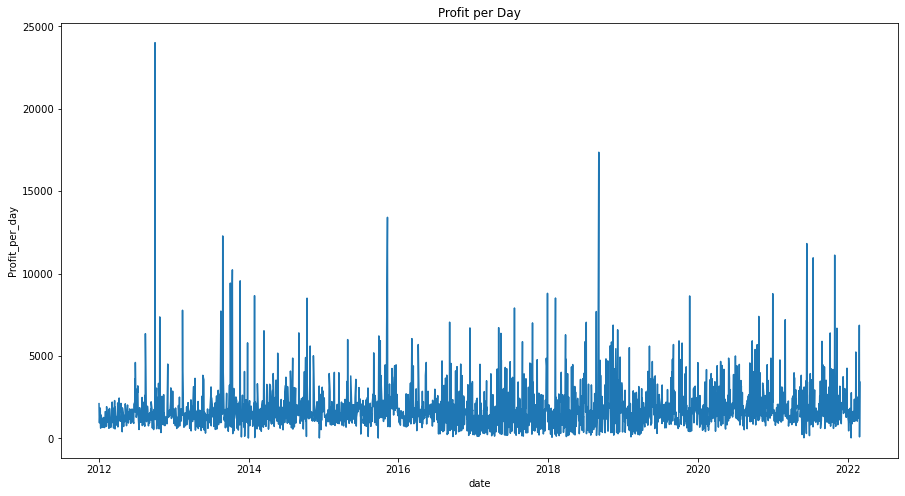

In [53]:
y=dailyprofits['Profit_per_day']
x=dailyprofits['date']
plt.figure(figsize=(15,8))
sns.lineplot(x,y)
plt.title('Profit per Day')

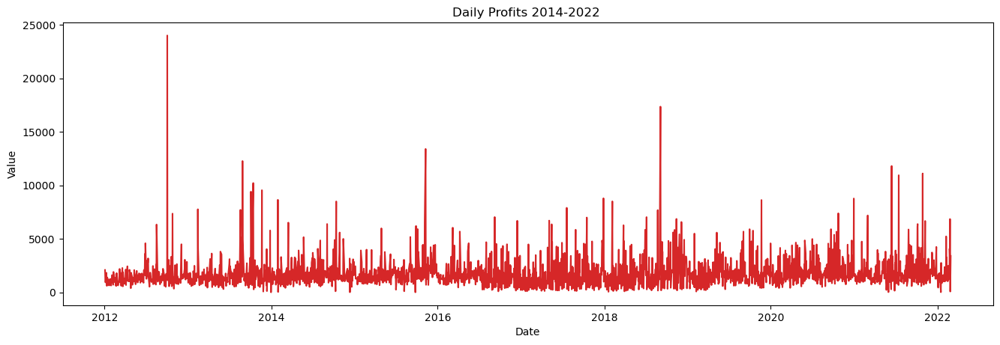

In [54]:
def plot_df(df, x, y, title="", xlabel='Date', ylabel='Value', dpi=100):
    plt.figure(figsize=(16,5), dpi=dpi)
    plt.plot(x, y, color='tab:red')
    plt.gca().set(title=title, xlabel=xlabel, ylabel=ylabel)
    plt.show()

plot_df(dailyprofits, x=dailyprofits.date, y=dailyprofits.Profit_per_day, title='Daily Profits 2014-2022 ')    

# Looking at bottles sold per day

In [55]:

#creating a dataframe of the total bottles sold per day
dailybottles=timedf.groupby(['date'])['bottles_sold'].sum().reset_index()

#dailysales = dailysales.set_index('date')

#rename sum of profit per sale to profit per day
dailybottles.rename({'bottles_sold': 'daily_bottles_sold'}, axis=1, inplace=True)

#converting the date to datetime format
#dailybottles['date']=pd.to_datetime(dailybottles['date'])
dailybottles.head()

,date,daily_bottles_sold
0,2012-01-03,494
1,2012-01-04,369
2,2012-01-05,242
3,2012-01-09,503
4,2012-01-10,195


Text(0.5, 1.0, 'Bottles Sold Per Day')

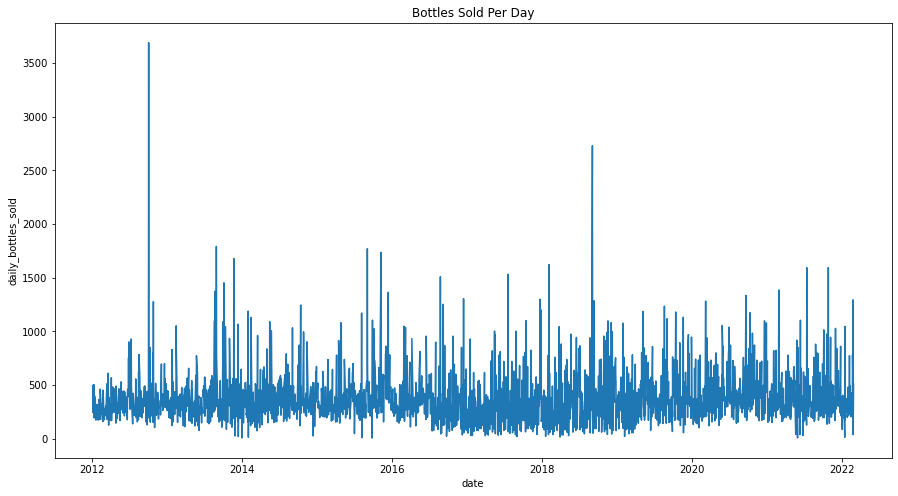

In [56]:
#plotting the bottles sold per day
y=dailybottles['daily_bottles_sold']
x=dailybottles['date']
plt.figure(figsize=(15,8))
sns.lineplot(x,y)
plt.title('Bottles Sold Per Day')

Text(0.5, 1.0, 'Daily Bottles Sold')

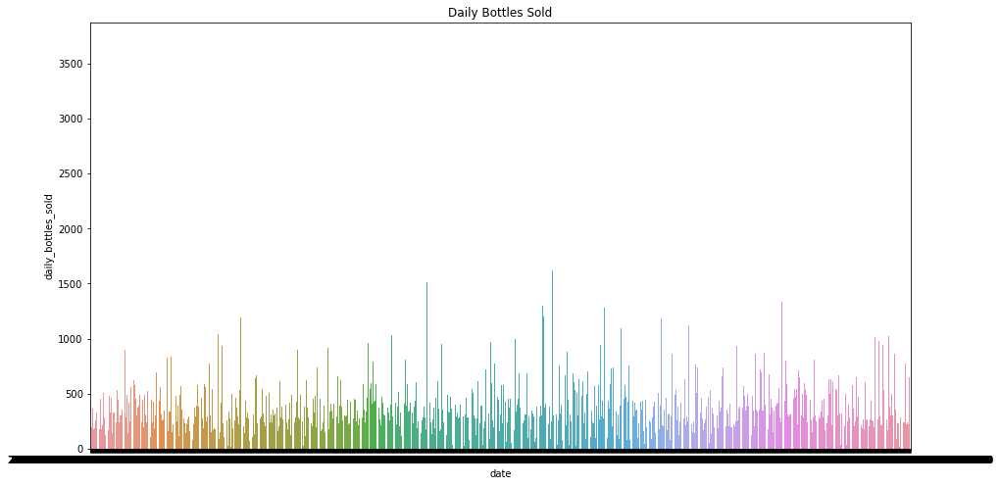

In [57]:
plt.figure(figsize=(15,8))
sns.barplot(x,y)
plt.title('Daily Bottles Sold')

# Comparing weekly sales

In [58]:
#making a new df to experiment with without ruining original
df2=df

#converting date column to datetime
df2['date'] = pd.to_datetime(df2['date'])

Text(0.5, 1.0, 'Bottles Sold Each Week')

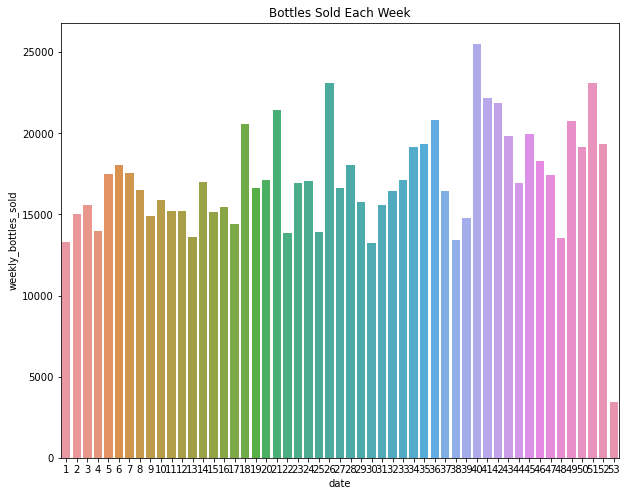

In [59]:
#finding the amount of bottles of liquor sold each week
weekly = df2.groupby(df2.date.dt.weekofyear)['bottles_sold'].agg('sum').reset_index()

#rename sum of bottles sold to weekly bottles sold
weekly.rename({'bottles_sold': 'weekly_bottles_sold'}, axis=1, inplace=True)

#plotting 
x1=weekly['date']
y1=weekly['weekly_bottles_sold']
plt.figure(figsize=(10,8))
sns.barplot(x1,y1)
plt.title('Bottles Sold Each Week')

<AxesSubplot:xlabel='date', ylabel='weekly_bottles_sold'>

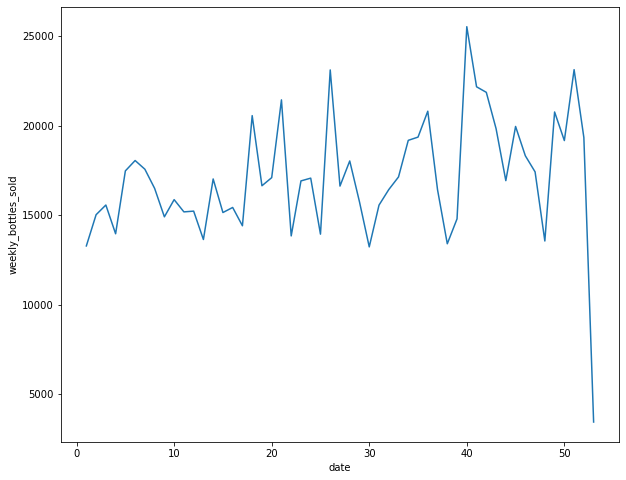

In [60]:
#lineplot of the weekly bottle sales
plt.figure(figsize=(10,8))
sns.lineplot(x1,y1)

Text(0.5, 1.0, 'Weekly Profit Each Week')

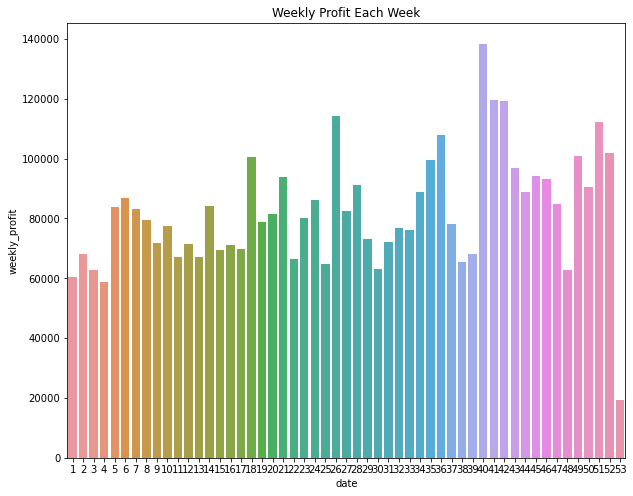

In [61]:
#finding the profit each week
weekly = df2.groupby(df2.date.dt.weekofyear)['Profit_per_sale'].agg('sum').reset_index()


#rename sum of bottles sold to weekly bottles sold
weekly.rename({'Profit_per_sale': 'weekly_profit'}, axis=1, inplace=True)

#plotting the profits by week
xw=weekly['date']
yw=weekly['weekly_profit']
plt.figure(figsize=(10,8))
sns.barplot(xw,yw)
plt.title('Weekly Profit Each Week')

<AxesSubplot:xlabel='date', ylabel='weekly_profit'>

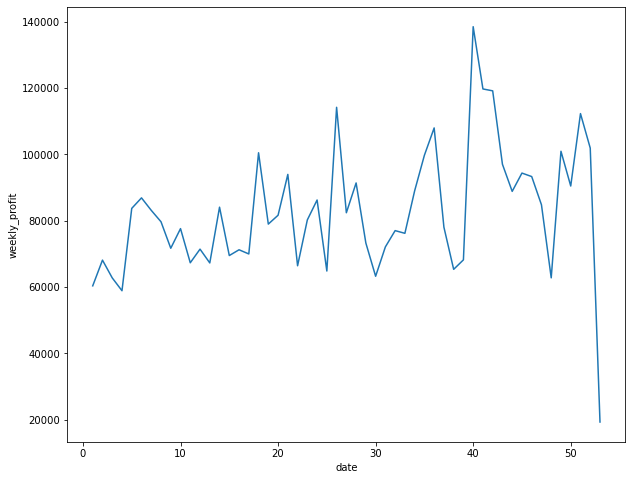

In [62]:
plt.figure(figsize=(10,8))
sns.lineplot(xw,yw)

<AxesSubplot:xlabel='date'>

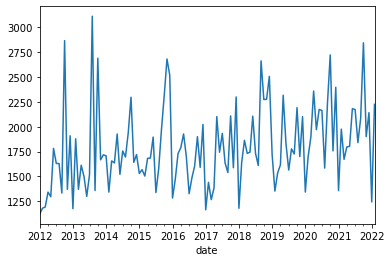

In [63]:
y = df.groupby('date')['Profit_per_sale'].sum().resample('MS').mean()
y.plot()

# Looking at months overall for seasonal patterns

Text(0.5, 1.0, 'Bottles Sold Each Month')

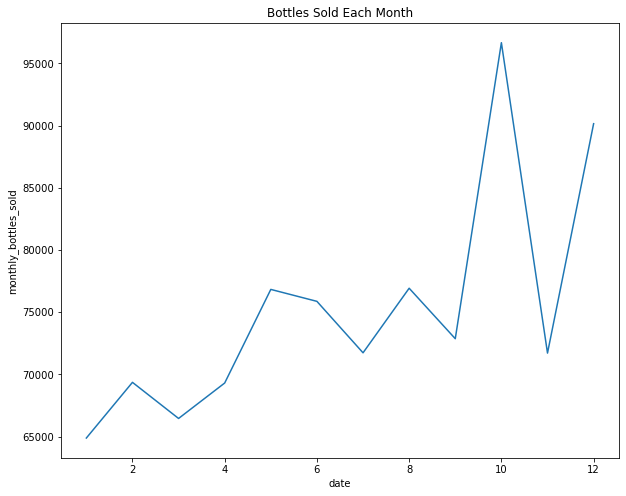

In [64]:
#finding the amount of bottles of liquor sold each month
monthly = df2.groupby(df2.date.dt.month)['bottles_sold'].agg('sum').reset_index()

#rename sum of bottles sold to monthly bottles sold
monthly.rename({'bottles_sold': 'monthly_bottles_sold'}, axis=1, inplace=True)

#plotting 
x1=monthly['date']
y1=monthly['monthly_bottles_sold']
plt.figure(figsize=(10,8))
sns.lineplot(x1,y1)
plt.title('Bottles Sold Each Month')

# Looking at months by year for overall trends

In [66]:
timedf['year_month'] = timedf['date'].dt.strftime('%Y-%m')

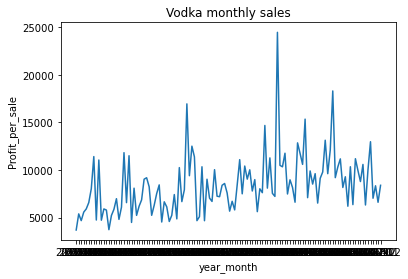

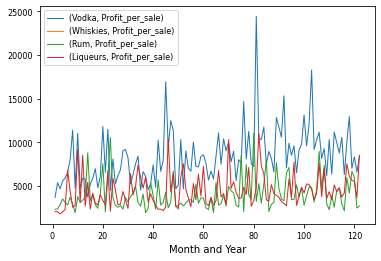

In [67]:
vodka = timedf[timedf['LiquorType'] == 'vodka'].groupby('year_month', as_index=False)['Profit_per_sale'].sum()
#print(vodka)

vodx=vodka['year_month']
vody=vodka['Profit_per_sale']

sns.lineplot(vodx,vody,data=vodka)
#plt.axhline(vodka['Profit_per_sale'].mean(),color="k",linestyle="dotted",linewidth=2)

plt.title('Vodka monthly sales') 

whisk = timedf[timedf['LiquorType'] == 'whisky/bourbon/scotch'].groupby('year_month', as_index=False)['Profit_per_sale'].sum()
whisky=whisk['Profit_per_sale']

rum = timedf[timedf['LiquorType'] == 'rum'].groupby('year_month', as_index=False)['Profit_per_sale'].sum()
rumy=rum['Profit_per_sale']

liqueurs = timedf[timedf['LiquorType'] == 'liqueurs'].groupby('year_month', as_index=False)['Profit_per_sale'].sum()
rumy=rum['Profit_per_sale']

top4=[vody, whisky, rumy, liqueurs]
headers = ["Vodka","Whiskies","Rum", "Liqueurs"]

top4_sell = pd.concat(top4, axis=1, keys=headers)
top4_sell.index = top4_sell.index +1

import matplotlib.ticker as ticker

ax = top4_sell.plot(linewidth=1,fontsize=8);
ax.set_xlabel('Month and Year');
ax.legend(fontsize=8)
ax.xaxis.set_major_locator(ticker.MultipleLocator(20));

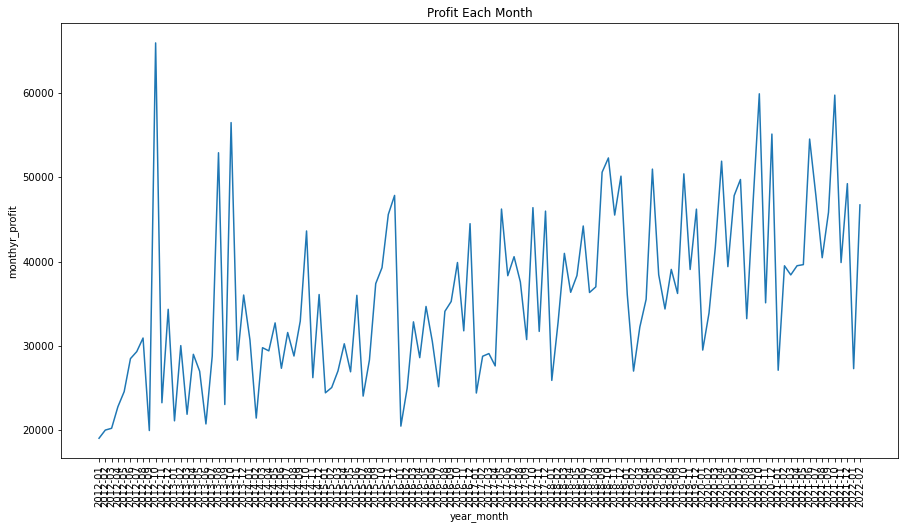

In [68]:
#finding the amount of profit of liquor sold each month
monthyr = timedf.groupby(timedf['year_month'])['Profit_per_sale'].agg('sum').reset_index()

#rename sum of profit sold to monthly bottles sold
monthyr.rename({'Profit_per_sale': 'monthyr_profit'}, axis=1, inplace=True)

#plotting 
xm=monthyr['year_month']
ym=monthyr['monthyr_profit']
plt.figure(figsize=(15,8))
sns.lineplot(xm,ym)
plt.title('Profit Each Month')
plt.xticks(rotation=90);
#plt.autofmt_xdate()

In [69]:
#monthyr.set_index('year_month', inplace=True)
monthyr['year_month']=pd.to_datetime(monthyr['year_month'])

In [70]:
monthyr.set_index('year_month', inplace=True)

In [71]:
monthyr

,monthyr_profit
year_month,
2012-01-01,19067.900391
2012-02-01,20037.259766
2012-03-01,20249.070312
2012-04-01,22802.048828
2012-05-01,24600.140625
2012-06-01,28510.169922
2012-07-01,29343.310547
2012-08-01,30953.009766
2012-09-01,19983.169922


<AxesSubplot:xlabel='year_month'>

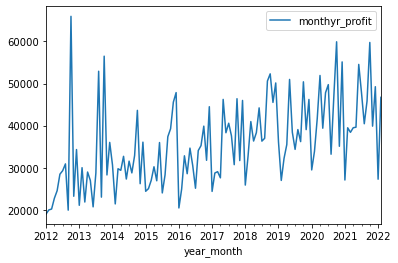

In [72]:
monthyr.plot()

In [73]:
from statsmodels.tsa.stattools import adfuller, kpss

In [74]:
#can make a function to find adf value
def adftest(series):
    results=adfuller(series)
    print(f'ADF Statistic: {results[0]}')
    print(f'p-value: {results[1]}')
    if results[1] <= 0.05:
        print('strong evidence againstnull hypothesis. Data is stationary')
    else:
        print('weak evidence against null hypothesis. Data is NON stationary')
        
adftest(monthyr['monthyr_profit'])

ADF Statistic: -0.5015922374544355
p-value: 0.8917054073833648
weak evidence against null hypothesis. Data is NON stationary


In [75]:
#repetitive but finding adf and kpss scores separately
# ADF Test
result = adfuller(monthyr.monthyr_profit.values, autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

#  if P-Value in ADH test is less than the significance level (0.05), you reject the null 
# hypothesis that the data is non-stationary. 
#we get pvalue which is under 0.05
# meaning that the null is accepted and the data is stationary
    
    
# KPSS Test
result = kpss(monthyr.monthyr_profit.values, regression='c')
print('\nKPSS Statistic: %f' % result[0])
print('p-value: %f' % result[1])
for key, value in result[3].items():
    print('Critial Values:')
    print(f'   {key}, {value}')
    


ADF Statistic: -0.5015922374544355
p-value: 0.8917054073833648
Critial Values:
   1%, -3.4912451337340342
Critial Values:
   5%, -2.8881954545454547
Critial Values:
   10%, -2.5809876033057852

KPSS Statistic: 1.626426
p-value: 0.010000
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


/Users/amandamanfredo/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




Text(0.5, 1.0, 'Liquor Sales detrended by subtracting the least squares fit')

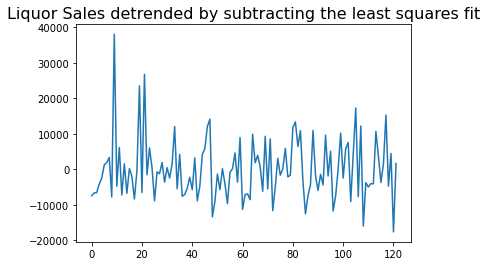

In [76]:
#Detrending a time series is to remove the trend component from a time series

# Using scipy: Subtract the line of best fit
from scipy import signal
detrended = signal.detrend(monthyr.monthyr_profit.values)
plt.plot(detrended)
plt.title('Liquor Sales detrended by subtracting the least squares fit', fontsize=16)


<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

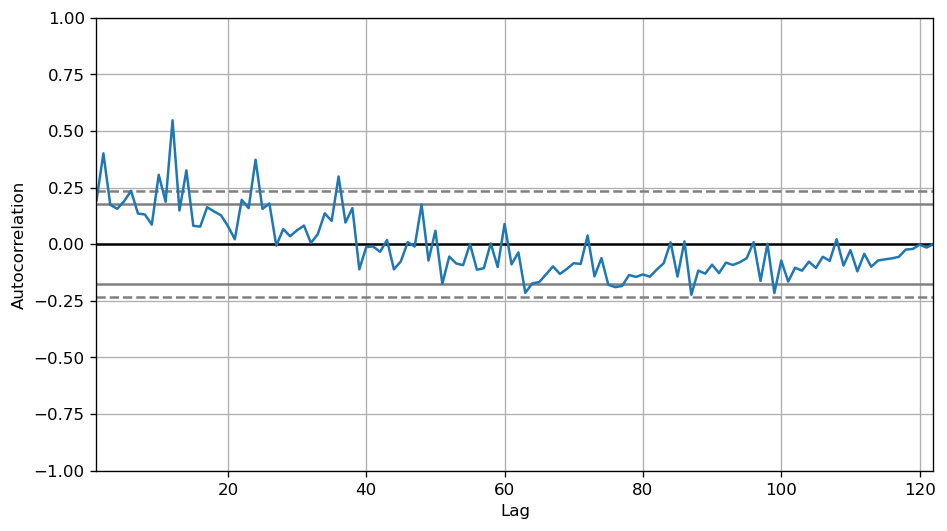

In [77]:
# when there is a strong seasonal pattern, the ACF plot usually reveals 
# definitive repeated spikes at the multiples of the seasonal window. 

from pandas.plotting import autocorrelation_plot
plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(monthyr.monthyr_profit.tolist())

In [78]:
# If a series is significantly autocorrelated, that means, the previous values of the series (lags) 
# may be helpful in predicting the current value. Partial Autocorrelation also conveys similar 
# information but it conveys the pure correlation of a series and its lag, excluding the correlation 
# contributions from the intermediate lags.


from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

#replaced by code below
# Calculate ACF and PACF upto 50 lags
# acf_50 = acf(monthyr.monthyr_profit, nlags=50)
# pacf_50 = pacf(monthyr.monthyr_profit, nlags=50)

# Draw Plot
# fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 100)
# plot_acf(monthyr.monthyr_profit.tolist(), lags=50, ax=axes[0])
# plot_pacf(monthyr.monthyr_profit.tolist(), lags=40, ax=axes[1])

In [79]:
#Testing if data is stationary after first difference= it is
adftest(monthyr.monthyr_profit.diff().dropna())

ADF Statistic: -9.568212110835466
p-value: 2.326041149408424e-16
strong evidence againstnull hypothesis. Data is stationary


# #Differencing the Timeseries data

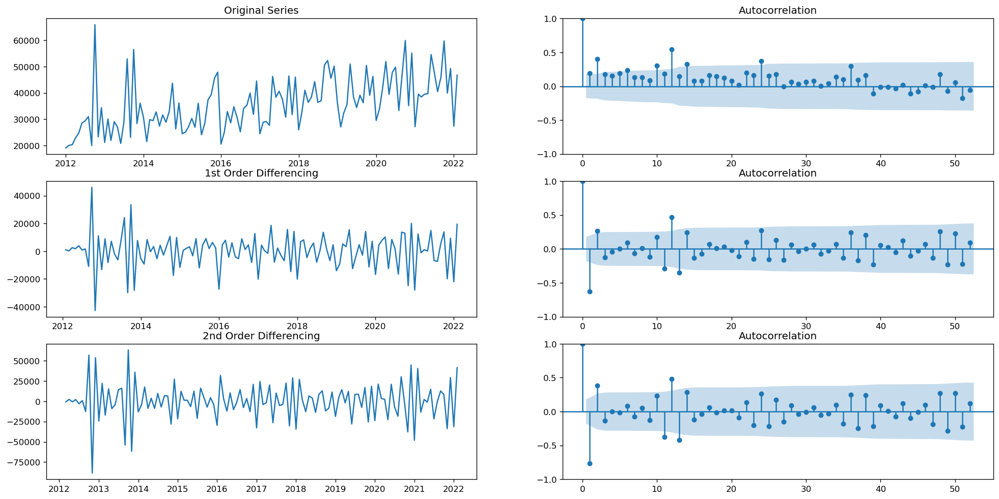

In [80]:
#Viewing the data in each state of differencing with its autocorrelation plot

# Original Series
fig, axes = plt.subplots(3, 2, figsize=(20,10))
axes[0, 0].plot(monthyr.monthyr_profit); axes[0, 0].set_title('Original Series')
plot_acf(monthyr.monthyr_profit, ax=axes[0, 1], lags=52)

# 1st Differencing
axes[1, 0].plot(monthyr.monthyr_profit.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(monthyr.monthyr_profit.diff().dropna(), ax=axes[1, 1], lags=52)

# 2nd Differencing
axes[2, 0].plot(monthyr.monthyr_profit.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(monthyr.monthyr_profit.diff().diff().dropna(), ax=axes[2, 1], lags=52)


plt.show()

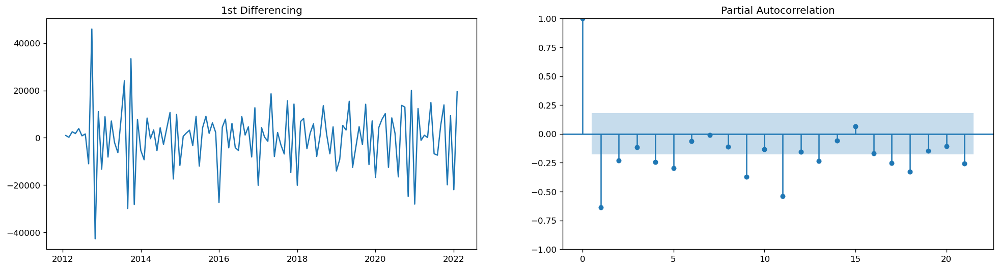

In [81]:
# PACF plot of 1st differenced series
fig, axes = plt.subplots(1, 2, figsize=(20,5))
axes[0].plot(monthyr.monthyr_profit.diff()); axes[0].set_title('1st Differencing')
plot_pacf(monthyr.monthyr_profit.diff().dropna(), ax=axes[1])

plt.show()


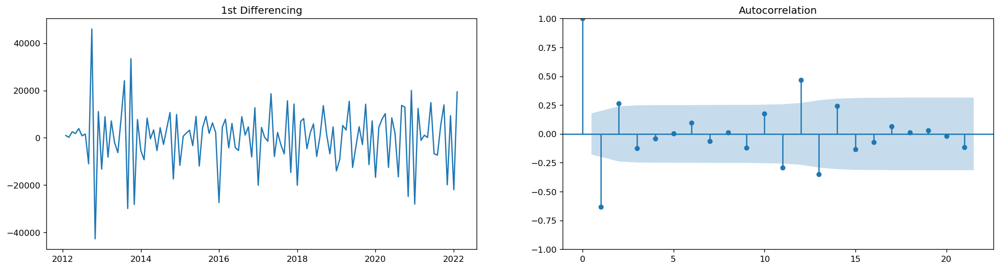

In [82]:
fig, axes = plt.subplots(1, 2, figsize=(20,5))
axes[0].plot(monthyr.monthyr_profit.diff()); axes[0].set_title('1st Differencing')
plot_acf(monthyr.monthyr_profit.diff().dropna(), ax=axes[1])
plt.show()


In [83]:
#p= 3 based on PACF, d=1 differencing once, q=1 from autocorrelation plot
from statsmodels.tsa.arima.model import ARIMA

model = ARIMA(monthyr.monthyr_profit,
              order=(5,1,1))
model_fit = model.fit()  #model_fit = model.fit(disp=0)
print(model_fit.summary())


                               SARIMAX Results                                
Dep. Variable:         monthyr_profit   No. Observations:                  122
Model:                 ARIMA(5, 1, 1)   Log Likelihood               -1271.989
Date:                Sun, 27 Mar 2022   AIC                           2557.978
Time:                        20:10:57   BIC                           2577.549
Sample:                    01-01-2012   HQIC                          2565.927
                         - 02-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0879      0.167     -0.525      0.599      -0.416       0.240
ar.L2          0.2056      0.130      1.586      0.113      -0.048       0.460
ar.L3         -0.0704      0.133     -0.529      0.5

/Users/amandamanfredo/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/amandamanfredo/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/amandamanfredo/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



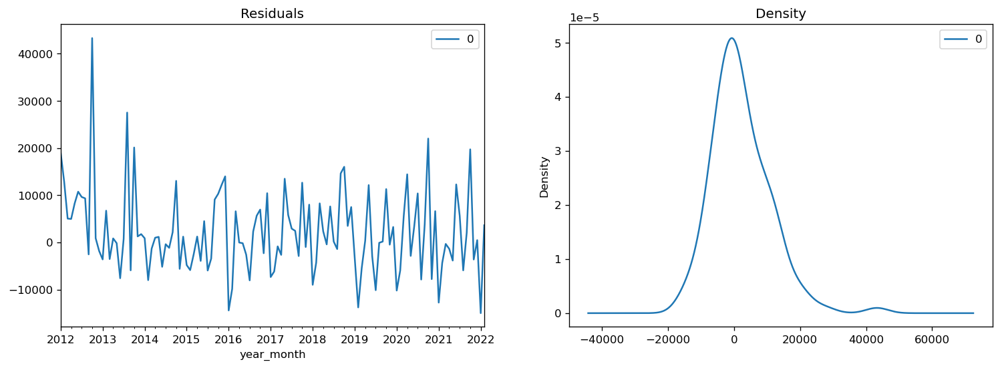

In [84]:
residuals = pd.DataFrame(model_fit.resid)
fig, ax = plt.subplots(1,2, figsize=(15,5))
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

Text(0, 0.5, 'Sale Profits')

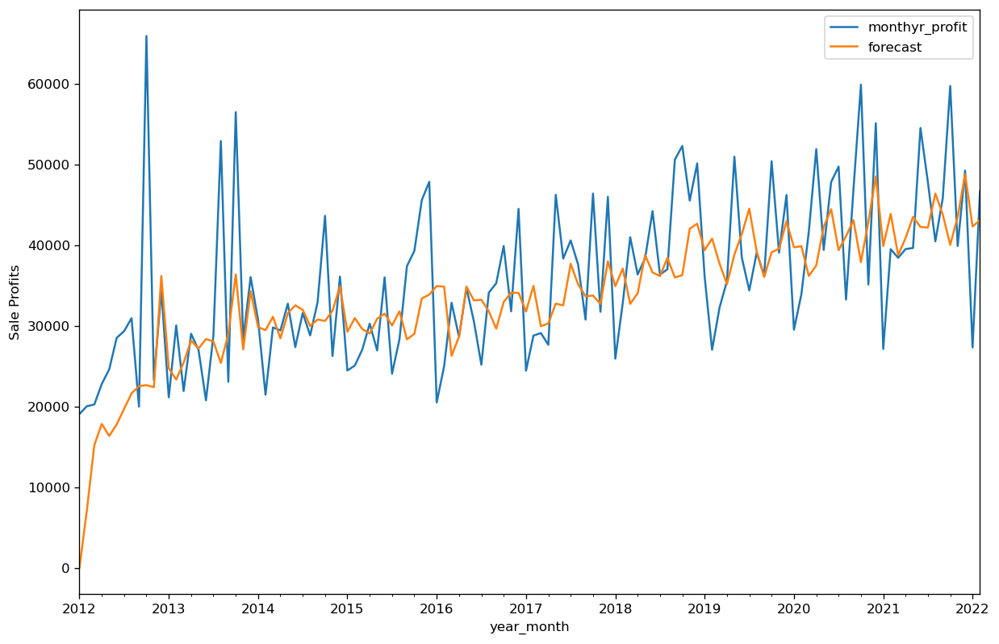

In [85]:
# Actual vs Fitted
monthyr['forecast']=model_fit.predict(dynamic=False)
monthyr[['monthyr_profit','forecast']].plot(figsize=(12,8), linewidth=1.5)
plt.ylabel('Sale Profits')

<AxesSubplot:>

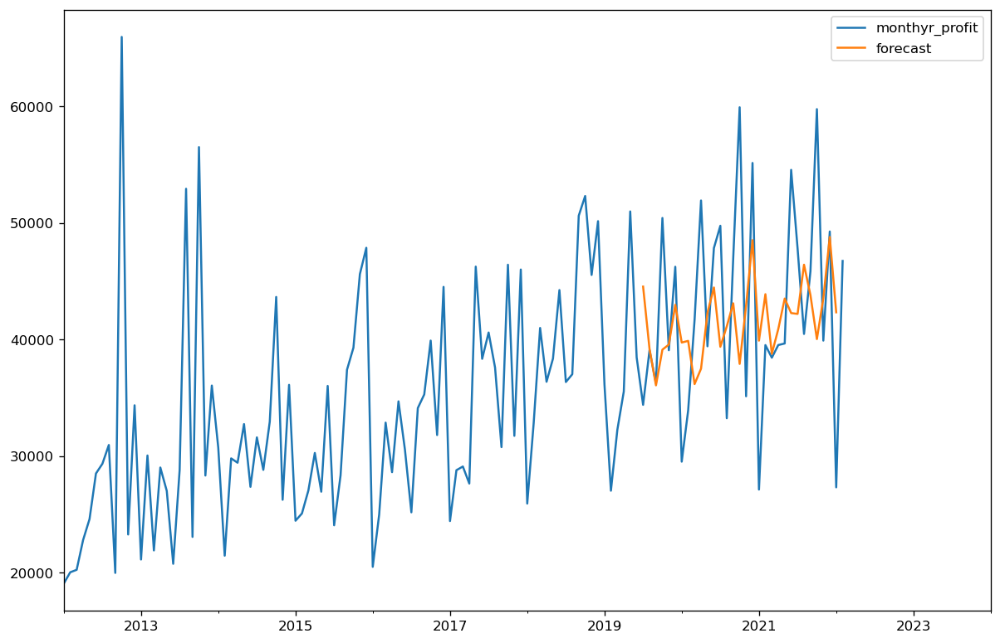

In [86]:
#another way to plot actual vs predicted that hopefully shows forecast
from pandas.tseries.offsets import DateOffset
pred_date=[monthyr.index[-1]+ DateOffset(months=x)for x in range(0,24)]
# Giving similar names to columns.

# Input:

pred_date=pd.DataFrame(index=pred_date[1:],columns=monthyr.columns)
pred_date

# monthyr['diff']=monthyr.monthyr_profit.diff().dropna()

monthyr=pd.concat([monthyr,pred_date])
monthyr['forecast'] = model_fit.predict(start = 90, end = 120, dynamic= False)
monthyr[['monthyr_profit', 'forecast']].plot(figsize=(12, 8), linewidth=1.5)

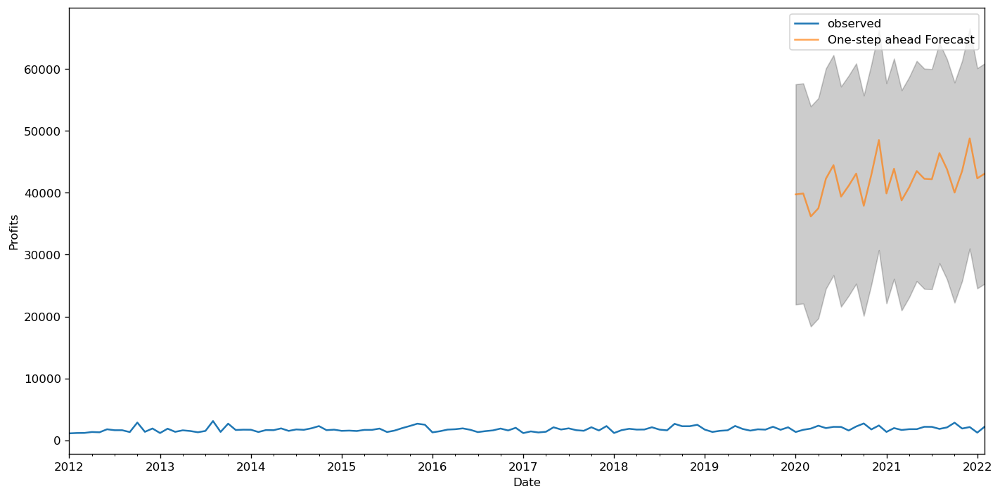

In [87]:
#pred = model_fit.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=False)

#update your data with the real values instead, you set dynamic=False
pred = model_fit.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=False)
pred_ci = pred.conf_int()
ax = y['2012':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Profits')
plt.legend()
plt.show()


In [88]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
# model = SARIMAX(monthyr.monthyr_profit.diff().dropna(),order=(5,1,1), exogeneous=monthyr.index,
#               seasonal_order=(5,1,1,12),enforce_stationarity=True,
#               enforce_invertibility=False)
# results = model.fit()

model = SARIMAX(monthyr.monthyr_profit,order=(5,1,1), exogeneous=monthyr.index,
              seasonal_order=(5,1,1,12),enforce_stationarity=True,
              enforce_invertibility=False)
results = model.fit()

/Users/amandamanfredo/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/amandamanfredo/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



<AxesSubplot:>

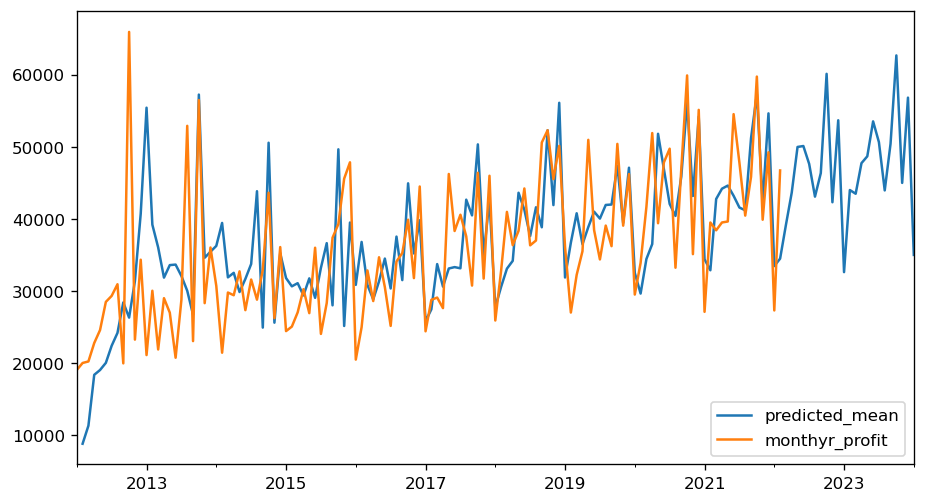

In [89]:
forecast = results.predict(dynamic=False)
forecast[1:].plot(linewidth=1.5,legend=True)
monthyr.monthyr_profit.plot(linewidth=1.5,legend=True)

# plt.ylabel('Sales Volume (Millions)');

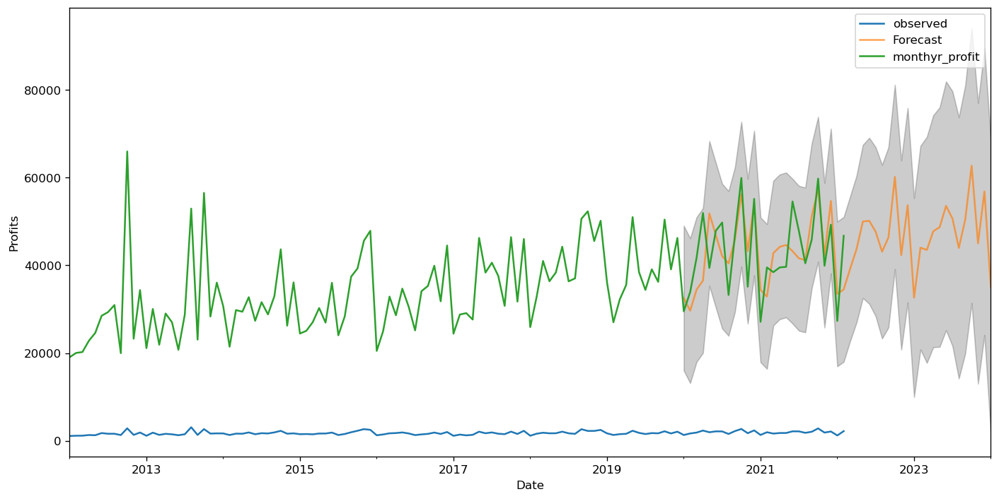

In [90]:
pred = results.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=False)
pred_ci = pred.conf_int()
ax = y['2012':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],pred_ci.iloc[:, 1], color='k', alpha=.2)
monthyr.monthyr_profit.plot(linewidth=1.5,legend=True)
ax.set_xlabel('Date')
ax.set_ylabel('Profits')
plt.legend()
plt.show()

In [91]:
monthyr.isna().sum()

monthyr_profit     23
forecast          114
dtype: int64

In [92]:
df.columns

Index(['date', 'store_number', 'store_name', 'address', 'city', 'zip_code',
       'county', 'category_name', 'vendor_number', 'vendor_name',
       'item_description', 'pack', 'state_bottle_cost', 'state_bottle_retail',
       'bottles_sold', 'sale_dollars', 'volume_sold_liters',
       'Profit_per_bottle', 'Profit_per_sale', 'Store Type', 'LiquorType',
       'Bottle Size', 'Longitude', 'Latitude', 'day_name', 'year_month'],
      dtype='object')

# Stepwise Regression for important features

In [93]:
df1=df

In [94]:
#separate types of columns/features
#categorical_features = df.select_dtypes(include = ["object"]).columns
categorical_features=['LiquorType', 'Store Type', 'Bottle Size', 'county', 'city']
numerical_features = ['pack', 'state_bottle_cost', 'state_bottle_retail','bottles_sold','volume_sold_liters',
                     'Longitude', 'Latitude']

numerics=df1[numerical_features]

cats=df1[categorical_features]


In [95]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
# transform data
scaled = scaler.fit_transform(df1[numerical_features])


In [96]:
df1[numerical_features]=scaled

In [97]:
df1[numerical_features]

,pack,state_bottle_cost,state_bottle_retail,bottles_sold,volume_sold_liters,Longitude,Latitude
0,-0.789266,0.189188,0.188903,-0.142075,0.010710,-0.299471,-0.378412
1,0.052151,0.358722,0.358439,0.405108,0.198555,-0.379048,-0.524653
3,-0.789266,0.653366,0.653087,-0.294070,-0.208443,1.171667,-0.691727
4,-0.789266,0.062717,0.062280,0.040319,0.273692,-0.535065,-0.425537
5,-0.789266,-0.005731,-0.006018,0.405108,0.799658,0.806031,0.276321
...,...,...,...,...,...,...,...
99995,-0.789266,0.018747,0.018460,-0.142075,0.010710,0.299780,1.358500
99996,-0.789266,-0.122682,-0.122971,-0.233272,-0.120782,-0.517515,0.963716
99997,0.052151,-0.139907,-0.140196,0.040319,-0.026859,-0.362520,-0.404758
99998,-0.929502,0.100795,0.100357,-0.020479,-0.239750,-1.761043,-0.999727


In [98]:
#numerics=pd.DataFrame(numerics)
cats

,LiquorType,Store Type,Bottle Size,county,city
0,vodka,Supermarket,750,polk,altoona
1,brandy,Supermarket,750,polk,des moines
3,liqueurs,Supermarket,750,muscatine,muscatine
4,whisky,Supermarket,750,dallas,waukee
5,whisky,Drug Store,750,linn,cedar rapids
...,...,...,...,...,...
99995,vodka,Supermarket,750,bremer,waverly
99996,whisky,Supermarket,750,hamilton,webster city
99997,rum,Supermarket,750,polk,des moines
99998,vodka,Supermarket,c,pottawatta,council bluffs


In [99]:
#dummifying the categorical features
dummy= pd.get_dummies(cats, drop_first=True)

In [100]:
dummy

,LiquorType_beer,LiquorType_brandy,LiquorType_cocktail mix,LiquorType_gifts,LiquorType_gin,LiquorType_liqueurs,LiquorType_mezcal,LiquorType_moonshine,LiquorType_rum,LiquorType_schnapps,LiquorType_tequila,LiquorType_vodka,LiquorType_whisky,Store Type_Drug Store,Store Type_Gas,Store Type_Liquor Store,Store Type_Supermarket,Bottle Size_1000,Bottle Size_200,Bottle Size_375,Bottle Size_750,Bottle Size_Other,Bottle Size_c,county_allamakee,county_appanoose,county_benton,county_black hawk,county_boone,county_bremer,county_buchanan,county_buena vist,county_buena vista,county_carroll,county_cass,county_cerro gord,county_cerro gordo,county_cherokee,county_clarke,county_clay,county_clayton,county_clinton,county_crawford,county_dallas,county_decatur,county_delaware,county_des moines,county_dubuque,county_emmet,county_fayette,county_floyd,county_franklin,county_greene,county_hamilton,county_hancock,county_hardin,county_henry,county_howard,county_humboldt,county_jasper,county_jefferson,county_johnson,county_jones,county_kossuth,county_lee,county_linn,county_madison,county_mahaska,county_marion,county_marshall,county_monroe,county_montgomery,county_muscatine,county_o'brien,county_obrien,county_page,county_palo alto,county_plymouth,county_polk,county_pottawatta,county_pottawattamie,county_poweshiek,county_ringgold,county_scott,county_shelby,county_sioux,county_story,county_tama,county_taylor,county_union,county_wapello,county_warren,county_washington,county_wayne,county_webster,county_winnebago,county_winneshiek,county_woodbury,city_algona,city_altoona,city_ames,city_ankeny,city_atlantic,city_bedford,city_bettendorf,city_boone,city_burlington,city_carroll,city_cedar falls,city_cedar rapids,city_centerville,city_charles city,city_cherokee,city_clarinda,city_clinton,city_clive,city_coralville,city_corning,city_corydon,city_council bluffs,city_cresco,city_creston,city_davenport,city_decorah,city_denison,city_des moines,city_dubuque,city_dyersville,city_eldora,city_emmetsburg,city_estherville,city_fairfield,city_forest city,city_fort dodge,city_fort madison,city_garner,city_grimes,city_grinnell,city_hampton,city_harlan,city_humboldt,city_independence,city_indianola,city_iowa city,city_iowa falls,city_jefferson,city_johnston,city_keokuk,city_knoxville,city_lamoni,city_le mars,city_lemars,city_leon,city_manchester,city_marion,city_marshalltown,city_mason city,city_monticello,city_mount ayr,city_mount pleasant,city_muscatine,city_nevada,city_newton,city_oelwein,city_orange city,city_osceola,city_oskaloosa,city_ottumwa,city_ottuwma,city_pella,city_perry,city_red oak,city_sheldon,city_shenandoah,city_sioux city,city_spencer,city_storm lake,city_toledo,city_urbandale,city_vinton,city_washington,city_waterloo,city_waukee,city_waukon,city_waverly,city_webster city,city_west des moines,city_windsor heights,city_winterset
0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0

In [101]:
# from sklearn.preprocessing import RobustScaler
# trans = RobustScaler()
# numerics= trans.fit_transform(x)
import statsmodels.api as sm
x=sm.add_constant(x)

In [102]:
x=pd.concat([dummy, df1[numerical_features]], axis=1)
y = np.log(df['Profit_per_sale']+1)

In [103]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test=train_test_split(x,y, test_size=.3)

In [104]:
import numpy as np

# def get_stats():
#   
results=sm.OLS(Y_train,X_train).fit()
print(results.summary())
# get_stats()

                            OLS Regression Results                            
Dep. Variable:        Profit_per_sale   R-squared:                       0.479
Model:                            OLS   Adj. R-squared:                  0.478
Method:                 Least Squares   F-statistic:                     430.8
Date:                Sun, 27 Mar 2022   Prob (F-statistic):               0.00
Time:                        20:12:07   Log-Likelihood:                -65746.
No. Observations:               59204   AIC:                         1.317e+05
Df Residuals:                   59077   BIC:                         1.329e+05
Df Model:                         126                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
LiquorType_beer           

In [105]:
pred=results.predict(X_test)

In [106]:
import sklearn.metrics as skl
skl.r2_score(Y_test, pred)

-1.0560344000913733

In [107]:
x.isna().sum()

LiquorType_beer            0
LiquorType_brandy          0
LiquorType_cocktail mix    0
LiquorType_gifts           0
LiquorType_gin             0
LiquorType_liqueurs        0
LiquorType_mezcal          0
LiquorType_moonshine       0
LiquorType_rum             0
LiquorType_schnapps        0
LiquorType_tequila         0
LiquorType_vodka           0
LiquorType_whisky          0
Store Type_Drug Store      0
Store Type_Gas             0
Store Type_Liquor Store    0
Store Type_Supermarket     0
Bottle Size_1000           0
Bottle Size_200            0
Bottle Size_375            0
Bottle Size_750            0
Bottle Size_Other          0
Bottle Size_c              0
county_allamakee           0
county_appanoose           0
county_benton              0
county_black hawk          0
county_boone               0
county_bremer              0
county_buchanan            0
county_buena vist          0
county_buena vista         0
county_carroll             0
county_cass                0
county_cerro g

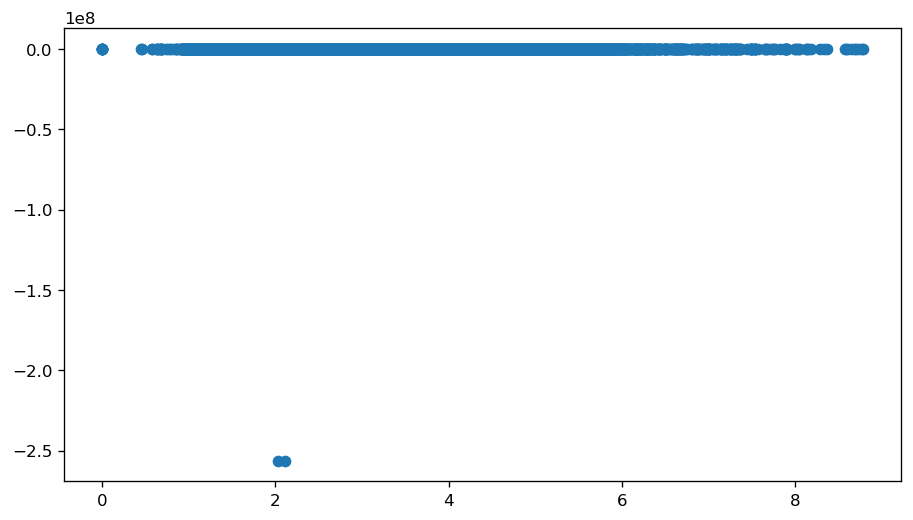

In [108]:
from sklearn import linear_model

lm = linear_model.LinearRegression() 
#generate fit of model base on training set

model = lm.fit(X_train, Y_train) 
#generate predicted values of y_test from X_test based off of training set
predictions = lm.predict(X_test)
#plotting predicted ys against y values in test set 
plt.scatter(Y_test, predictions)


In [109]:
from sklearn.linear_model import LassoCV
from sklearn.model_selection import RepeatedKFold

cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
lasso = LassoCV(alphas=np.arange(0, 1, 0.01), cv=cv, n_jobs=-1)

In [110]:
lasso.fit(X_train, Y_train);

In [111]:
lasso.score(X_train, Y_train)

0.47872972518607537

In [112]:
lasso.score(X_test, Y_test)
#big difference between train and test set indicating overfitting

-1.0556262925299276

Lasso picked 194 features and eliminated the other 1 features


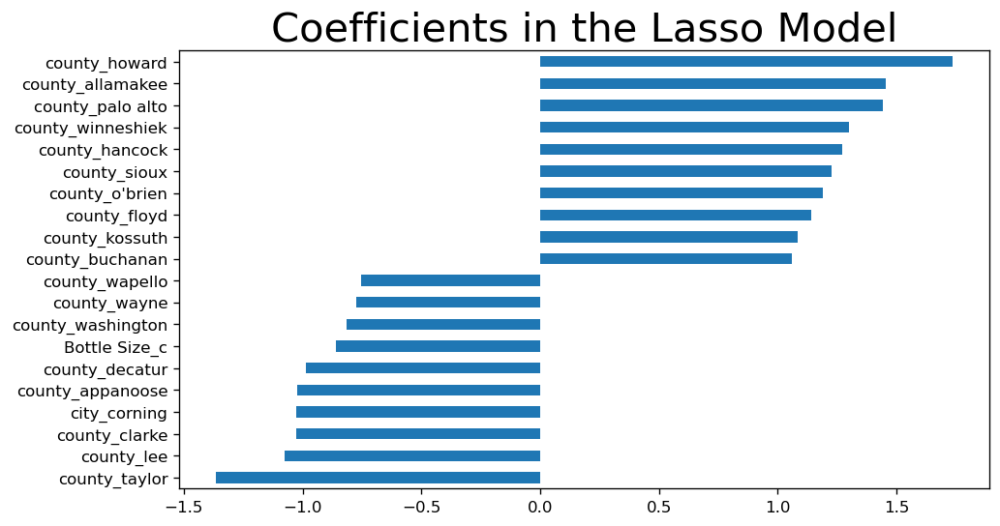

In [113]:
# Plot important coefficients of 2nd model
coefs1 = pd.Series(lasso.coef_, index = X_train.columns)
print("Lasso picked " + str(sum(coefs1 != 0)) + " features and eliminated the other " +  \
      str(sum(coefs1 == 0)) + " features")
imp_coefs = pd.concat([coefs1.sort_values().head(10),
                     coefs1.sort_values().tail(10)])
imp_coefs.plot(kind = "barh")
plt.title("Coefficients in the Lasso Model", fontsize=25)
plt.show()

In [114]:
#df[numerical_features]
numerics

,pack,state_bottle_cost,state_bottle_retail,bottles_sold,volume_sold_liters,Longitude,Latitude
0,6,14.75,22.129999,6,10.50,-93.465301,41.644041
1,12,18.49,27.740000,24,18.00,-93.596754,41.554101
3,6,24.99,37.490002,1,1.75,-91.035138,41.451349
4,6,11.96,17.940001,12,21.00,-93.854477,41.615059
5,6,10.45,15.680000,24,42.00,-91.639130,42.046710
...,...,...,...,...,...,...,...
99995,6,10.99,16.490000,6,10.50,-92.475403,42.712263
99996,6,7.87,11.810000,3,5.25,-93.825486,42.469466
99997,12,7.49,11.240000,12,9.00,-93.569452,41.627838
99998,5,12.80,19.200001,10,0.50,-95.879662,41.261925


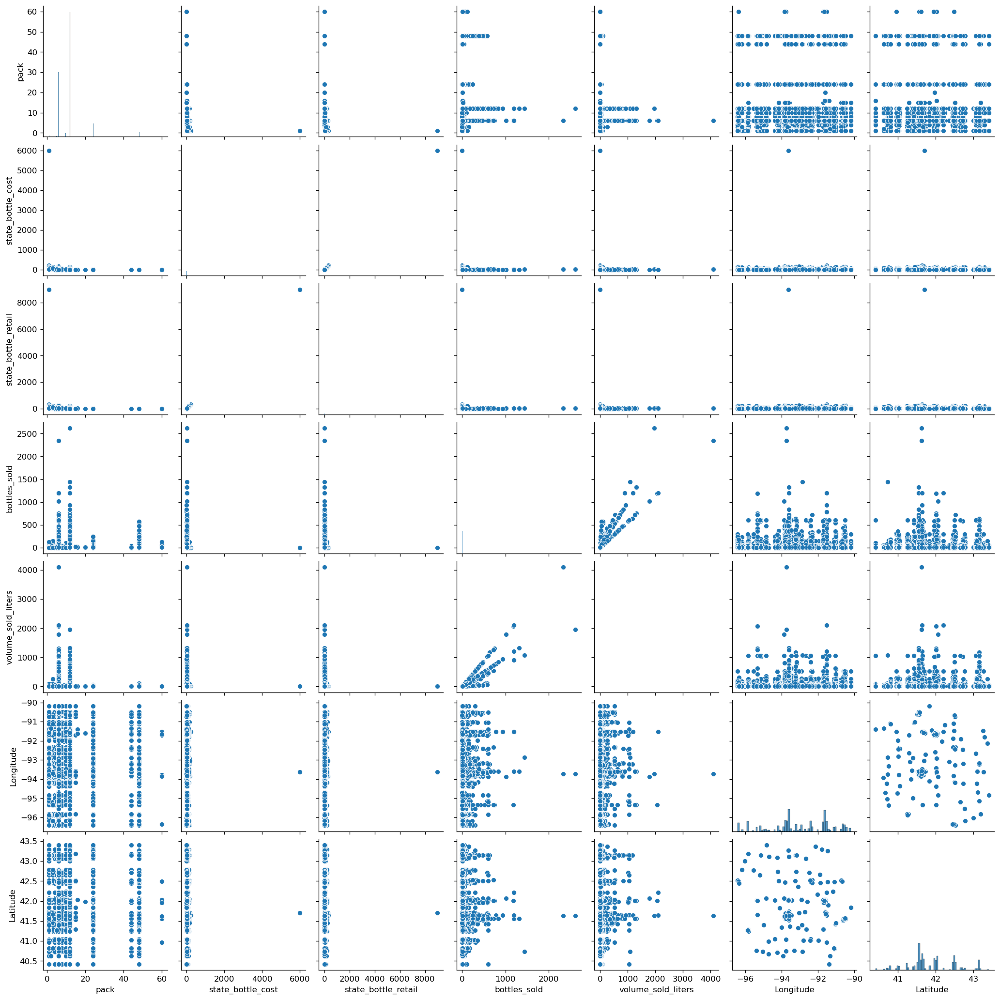

In [115]:
sns.pairplot(numerics)

In [ ]:
#k nearest neighbor
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
knn=KNeighborsClassifier(n_neighbors=1)

In [ ]:
X_train, X_test, Y_train, Y_test=train_test_split(num,y, test_size=.3)

In [ ]:
knn.fit(X_train, Y_train)

In [ ]:
num=df[numerical_features]

cat=df[categorical_features]



In [ ]:
from kneed import KneeLocator
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

In [ ]:
kmeans = KMeans(
init="random",
n_clusters=5,
n_init=10,
max_iter=300,
    random_state=42)


In [ ]:
 kmeans.fit(numerics)

In [ ]:
 # The lowest SSE value
kmeans.inertia_

In [ ]:
kmeans.cluster_centers_

In [ ]:
kmeans.labels_

In [ ]:
# The number of iterations required to converge
kmeans.n_iter_

In [ ]:
kmeans_kwargs = {
 "init": "random", "n_init": 10,"max_iter": 300,"random_state": 42}


sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(numerics)
    sse.append(kmeans.inertia_)

In [ ]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [ ]:
kl = KneeLocator(
range(1, 11), sse, curve="convex", direction="decreasing")

k=kl.elbow
k

In [ ]:
labels = kmeans.labels_
centers = kmeans.cluster_centers_
plt.scatter(x.iloc[:, 19], x.iloc[:, 20], c = labels, alpha = 0.8)
plt.scatter(centers[:, 5], centers[:, 5], marker = '+', s = 1000, c = [0, 1, 2,3,4,5,6,7,8,9])
plt.show()

In [ ]:
labels

In [ ]:
# sns.scatterplot(x[:,0], x[:, 1], hue=cluster)
# sns.scatterplot(centroids[:,0], centroids[:, 1], s=100, color='y')
# plt.xlabel('Income')
# plt.ylabel('Loan')
# plt.show()

# Tree Based models

In [136]:
num=df[numerical_features]
cat=df[categorical_features]
#cat=cat.astype(float)

In [137]:
treex=pd.concat([num, cat], axis=1)
treey=y = df['Profit_per_sale']

In [138]:
treex.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 84578 entries, 0 to 99999
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   pack                 84578 non-null  float64
 1   state_bottle_cost    84578 non-null  float64
 2   state_bottle_retail  84578 non-null  float64
 3   bottles_sold         84578 non-null  float64
 4   volume_sold_liters   84578 non-null  float64
 5   Longitude            84578 non-null  float64
 6   Latitude             84578 non-null  float64
 7   LiquorType           84578 non-null  object 
 8   Store Type           84578 non-null  object 
 9   Bottle Size          84578 non-null  object 
 10  county               84578 non-null  object 
 11  city                 84578 non-null  object 
dtypes: float64(7), object(5)
memory usage: 8.4+ MB


In [139]:
X_train, X_test, Y_train, Y_test=train_test_split(num,treey, test_size=.3)

In [140]:
from sklearn import tree
tree_model = tree.DecisionTreeRegressor()
# tree_model = tree.DecisionTreeRegressor(criterion="mse",min_samples_leaf=20)

In [142]:
tree_model.fit(X_train, Y_train)
print(f'Training score is: %5f',tree_model.score(X_train, Y_train))
print(f'Testing score is: %5f',tree_model.score(X_test, Y_test))
# train_error = (1 - tree_model.score(X_train, Y_train))
# test_error = (1 - tree_model.score(X_test, Y_test))
# print("The training error is: %.5f" %train_error)
# print("The test     error is: %.5f" %test_error)


Training score is: %5f 1.0
Testing score is: %5f 0.8774632118332484


In [143]:
feature_importance = tree_model.feature_importances_
feature_importance

array([4.41268290e-05, 5.54277702e-02, 4.25625063e-02, 3.04237454e-01,
       5.97020143e-01, 1.15043349e-04, 5.92956453e-04])

In [144]:
predictions =tree_model.predict(X_test)
predictions

array([ 7.89000034, 83.87999725, 30.        , ..., 20.28000069,
       36.        , 50.87999725])

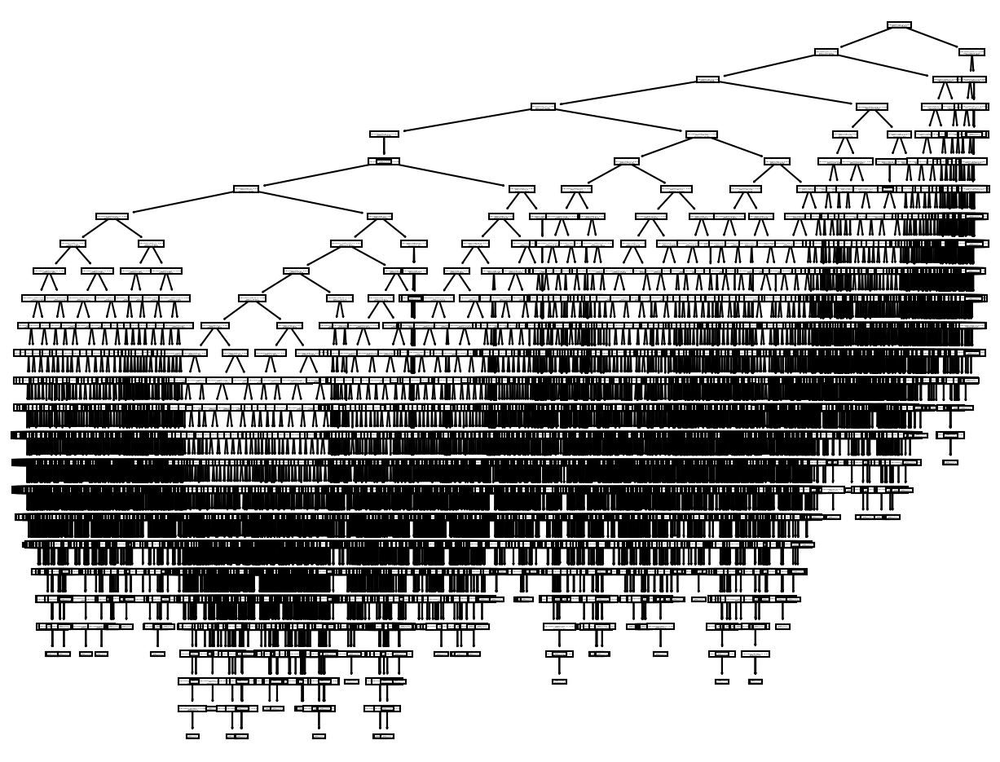

In [145]:
from sklearn.tree import plot_tree
plt.figure(figsize=(10,8), dpi=150)
plot_tree(tree_model, feature_names=x.columns);

In [ ]:
# #gridsearch for the decision tree model
# from sklearn.model_selection import GridSearchCV
# grid_para_tree = [{
#     "criterion": ["gini", "entropy"],
#     "min_samples_leaf": range(1, 10),
#     "min_samples_split": np.linspace(start=2, stop=30, num=15, dtype=int)
# }]
# tree_model.set_params(random_state=108)
# grid_search_tree = GridSearchCV(
#     tree_model, grid_para_tree, cv=5, scoring='accuracy', n_jobs=-1)

# %time grid_search_tree.fit(X_train, Y_train) #see how long to fit model

In [ ]:
#finding the best parameters
grid_search_tree.best_params_

In [ ]:
## best score
grid_search_tree.best_score_

In [ ]:
## The overall accuracy on the training set:
grid_search_tree.score(X_train, Y_train)

In [ ]:
## The overall accuracy on the test set:
grid_search_tree.score(X_test, Y_test)